In [1]:
from pathlib import Path
# from PIL import Image
from engine import train_one_epoch, evaluate
import utils
import transforms as T
from torchvision import transforms as TR
import os
import numpy as np
import torch
import torch.utils.data
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import PIL
import matplotlib.pyplot as plt
from PIL import ImageDraw, ImageFont
from matplotlib import patches, patheffects
import json
from fastai.vision import *
warnings.filterwarnings('ignore')

In [2]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    # ax.get_xaxis().set_visible(False)
    # ax.get_yaxis().set_visible(False)
    return ax

def draw_outline(o, lw=12):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, bb):
    for b in bb:
        w = b[2]-b[0]
        h = b[3]-b[1]
        xy = (b[0], b[1])
        patch = ax.add_patch(patches.Rectangle(xy, w,h, fill=False, edgecolor='white', lw=2))
        draw_outline(patch, 4)

def draw_text(ax, bb, nn,  sz=14):
  for i, b in enumerate(bb):
    xy = b[:2]
    n = nn[i]
    n = lab2cats[n.item()]
    text = ax.text(*xy, n,
        verticalalignment='top', color='white', fontsize=sz, weight='bold')
    draw_outline(text, 1)

path = Path('/home/davood/textSegmentChallenge/')
pathImages = path/'images'
pathMasks = path/'masks'
# pathJsons = path/'jsons'
imageList = sorted(list(pathImages.iterdir()))
masksList = sorted(list(pathMasks.iterdir()))
# jsonList = sorted(list(pathJsons.iterdir()))
# img = Image.open(imageList[0])

# mask = Image.open(masksList[0])
# # mask = Image.fromarray((np.array(mask.resize((int(800*(mask.size[0]/mask.size[1])), 800)))))
# # each mask instance has a different color, from zero to N, where
# # N is the number of instances. In order to make visualization easier,
# # let's adda color palette to the mask.
# mask.putpalette([
#     0, 0, 0, # black background
#     255, 0, 0, # index 1 is red
#     255, 255, 0, # index 2 is yellow
#     255, 153, 0, # index 3 is orange
# ])
# mask

In [3]:
imgs = list(sorted(os.listdir(os.path.join(path, "images"))))
masks = list(sorted(os.listdir(os.path.join(path, "masks"))))
# jsons = list(sorted(os.listdir(os.path.join(path, 'jsons'))))

In [4]:
idx = 0
# load images ad masks
img_path = os.path.join(path, "images", imgs[idx])
mask_path = os.path.join(path, "masks", masks[idx])
# json_path = os.path.join(path, "jsons", jsons[idx])

In [5]:
from fastai.vision.image import TfmCoord, TfmLighting, TfmAffine, TfmPixel
from fastai.vision.transform import _do_perspective_warp
def _symmetric_warp(c, magnitude=torch.tensor([-0.1765,  0.0990,  0.1439,  0.1102]), invert=False):
    "Apply symmetric warp of `magnitude` to `c`."
    m = listify(magnitude, 4)
    targ_pts = [[-1-m[3],-1-m[1]], [-1-m[2],1+m[1]], [1+m[3],-1-m[0]], [1+m[2],1+m[0]]]
    return _do_perspective_warp(c, targ_pts, invert)
symmetric_warp = TfmCoord(_symmetric_warp)

def _rotate(degrees):
    "Rotate image by `degrees`."
    angle = degrees * math.pi / 180
    return [[cos(angle), -sin(angle), 0.],
            [sin(angle),  cos(angle), 0.],
            [0.        ,  0.        , 1.]]
rotate = TfmAffine(_rotate)

def _flip_lr(x, is_flipped=False):
    "Flip `x` horizontally."
    #return x.flip(2)
    if isinstance(x, ImagePoints):
        print('image is ImagePoints! It will always be flipped')
        x.flow.flow[...,0] *= -1
        return x
    return tensor(np.ascontiguousarray(np.array(x)[...,::-1])) if is_flipped else x

flip_lr = TfmPixel(_flip_lr)

In [ ]:
crop_size=800; crop_row_pct=uniform(0,1); crop_col_pct=uniform(0,1)

# flip_lr: no *args
warp_uniform= partial(uniform,size=4)(-.2, .2)
rotate_uni = uniform(-10.,10.)
zoom_scale = uniform(1.,1.1); zoom_row_pct = uniform(0,1); zoom_col_pct = uniform(0,1)
flip_prob = np.random.rand()<.5
### brightness(change=(0.5*(.5), 0.5*(1.5)))
### contrast: scale = (.5, 1/(.5))

tfm = [crop(size=crop_size, row_pct=crop_row_pct, col_pct=crop_col_pct), flip_lr(is_flipped=flip_prob), 
        symmetric_warp(magnitude=warp_uniform), rotate(degrees=rotate_uni), 
        zoom(scale=zoom_scale, row_pct=zoom_row_pct, col_pct=zoom_col_pct), 
        brightness(change=(0.5*(1.5))), contrast(scale=(.5, 1/(.5)))]
# symmetric warp
# magnitudes = torch.tensor(np.zeros(8))
# magnitudes[i] = 0.5
# perspective_warp(im, magnitudes)

# # contrast
# # scale in np.exp(np.linspace(log(0.5),log(2),5)):
# contrast(im, scale)

b = open_image(img_path)
size = 800

(b.apply_tfms(tfms=tfm, mode='bilinear'))

c = open_mask(mask_path)

(c.apply_tfms(tfms=tfm, mode='nearest'));

In [10]:
class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "images"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "masks"))))
#         self.jsons = list(sorted(os.listdir(os.path.join(root, 'jsons'))))
    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        mask_path = os.path.join(self.root, "masks", self.masks[idx])
#         json_path = os.path.join(self.root, "jsons", self.jsons[idx])
        size = 800
        # Transforms start
        crop_size=800; crop_row_pct=uniform(0,1); crop_col_pct=uniform(0,1)

        # flip_lr:
        flip_prob = np.random.rand()<.5
        warp_uniform= partial(uniform,size=4)(-.2, .2)
        rotate_uni = uniform(-10.,10.)
        zoom_scale = uniform(1.,1.1); zoom_row_pct = uniform(0,1); zoom_col_pct = uniform(0,1)
        
        ### brightness(change=(0.5*(.5), 0.5*(1.5)))
        ### contrast: scale = (.5, 1/(.5))

        tfm = [crop_pad(size=crop_size, row_pct=crop_row_pct, col_pct=crop_col_pct), 
               flip_lr(is_flipped=flip_prob), 
               symmetric_warp(magnitude=warp_uniform), 
               rotate(degrees=rotate_uni), 
               zoom(scale=zoom_scale, row_pct=zoom_row_pct, col_pct=zoom_col_pct), 
               brightness(change=(0.5*(1-.2), 0.5*(1+.2))), 
               contrast(scale=(1-.2, 1/(1-.2)))]
        
        b = open_image(img_path)
        img = b.apply_tfms(tfms=tfm, mode='bilinear', size=(800,800)).px

        c = open_mask(mask_path)
        mask = c.apply_tfms(tfms=tfm, mode='nearest', size=(800, 800)).px.numpy().astype(np.uint8)
        
        self.mask_tot = mask

#         img = PIL.Image.open(img_path).convert("RGB")
#         img = img.resize((800,800))
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
#         mask = PIL.Image.open(mask_path)
#         mask = mask.resize((800,800), resample=0)
#         mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]
        
#         # get labels from json
#         with open(json_path) as j:
#             dic = json.load(j)
#         label = [cats2lab[dic[str(o)]] for o in obj_ids]    
        
        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
#         labels = torch.tensor(label, dtype=torch.int64)
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

#         if self.transforms is not None:
#             img, target= self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.imgs)

class ValidDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "images"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "masks"))))
#         self.jsons = list(sorted(os.listdir(os.path.join(root, 'jsons'))))
    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
        mask_path = os.path.join(self.root, "masks", self.masks[idx])
#         json_path = os.path.join(self.root, "jsons", self.jsons[idx])
        size = 800
#         # Transforms start
#         crop_size=800; crop_row_pct=uniform(0,1); crop_col_pct=uniform(0,1)

#         # flip_lr: no *args
#         warp_uniform= partial(uniform,size=4)(-.2, .2)
#         rotate_uni = uniform(-10.,10.)
#         zoom_scale = uniform(1.,1.1); zoom_row_pct = uniform(0,1); zoom_col_pct = uniform(0,1)
#         ### brightness(change=(0.5*(.5), 0.5*(1.5)))
#         ### contrast: scale = (.5, 1/(.5))

#         tfm = [crop(size=crop_size, row_pct=crop_row_pct, col_pct=crop_col_pct), flip_lr(), 
#                 symmetric_warp(magnitude=warp_uniform), rotate(degrees=rotate_uni), 
#                 zoom(scale=zoom_scale, row_pct=zoom_row_pct, col_pct=zoom_col_pct), 
#                 brightness(change=(0.5*(1.5))), contrast(scale=(.5, 1/(.5)))]
        
#         b = open_image(img_path)
#         img = b.apply_tfms(tfms=tfm, mode='bilinear', size=(size, size)).px

#         c = open_mask(mask_path)
#         mask = c.apply_tfms(tfms=tfm, mode='nearest', size=(size, size)).px.numpy().astype(np.uint8)


        img = PIL.Image.open(img_path).convert("RGB")
        img = img.resize((800,800))
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = PIL.Image.open(mask_path)
        mask = mask.resize((800,800), resample=0)
        mask = np.array(mask)
        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]
        
#         get labels from json
#         with open(json_path) as j:
#             dic = json.load(j)
#         label = [cats2lab[dic[str(o)]] for o in obj_ids]    
        
        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
#         labels = torch.tensor(label, dtype=torch.int64)
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target= self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.imgs)
    
class TestDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "images"))))
#         self.masks = list(sorted(os.listdir(os.path.join(root, "masks"))))
#         self.jsons = list(sorted(os.listdir(os.path.join(root, 'jsons'))))
    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "images", self.imgs[idx])
#         mask_path = os.path.join(self.root, "masks", self.masks[idx])
#         json_path = os.path.join(self.root, "jsons", self.jsons[idx])
        size = 800
#         # Transforms start
#         crop_size=800; crop_row_pct=uniform(0,1); crop_col_pct=uniform(0,1)

#         # flip_lr: no *args
#         warp_uniform= partial(uniform,size=4)(-.2, .2)
#         rotate_uni = uniform(-10.,10.)
#         zoom_scale = uniform(1.,1.1); zoom_row_pct = uniform(0,1); zoom_col_pct = uniform(0,1)
#         ### brightness(change=(0.5*(.5), 0.5*(1.5)))
#         ### contrast: scale = (.5, 1/(.5))

#         tfm = [crop(size=crop_size, row_pct=crop_row_pct, col_pct=crop_col_pct), flip_lr(), 
#                 symmetric_warp(magnitude=warp_uniform), rotate(degrees=rotate_uni), 
#                 zoom(scale=zoom_scale, row_pct=zoom_row_pct, col_pct=zoom_col_pct), 
#                 brightness(change=(0.5*(1.5))), contrast(scale=(.5, 1/(.5)))]
        
#         b = open_image(img_path)
#         img = b.apply_tfms(tfms=tfm, mode='bilinear', size=(size, size)).px

#         c = open_mask(mask_path)
#         mask = c.apply_tfms(tfms=tfm, mode='nearest', size=(size, size)).px.numpy().astype(np.uint8)


        img = PIL.Image.open(img_path).convert("RGB")
        sz = img.size
        img = img.resize((800,800))
#         img = TR.ToTensor(img)
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
#         mask = PIL.Image.open(mask_path)
#         mask = mask.resize((800,800), resample=0)
#         mask = np.array(mask)
        # instances are encoded as different colors
#         obj_ids = np.unique(mask)
#         # first id is the background, so remove it
#         obj_ids = obj_ids[1:]
        
#         get labels from json
#         with open(json_path) as j:
#             dic = json.load(j)
#         label = [cats2lab[dic[str(o)]] for o in obj_ids]    
        
        # split the color-encoded mask into a set
        # of binary masks
#         masks = mask == obj_ids[:, None, None]

#         # get bounding box coordinates for each mask
#         num_objs = len(obj_ids)
#         boxes = []
#         for i in range(num_objs):
#             pos = np.where(masks[i])
#             xmin = np.min(pos[1])
#             xmax = np.max(pos[1])
#             ymin = np.min(pos[0])
#             ymax = np.max(pos[0])
#             boxes.append([xmin, ymin, xmax, ymax])

#         boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
#         labels = torch.tensor(label, dtype=torch.int64)
#         labels = torch.ones((num_objs,), dtype=torch.int64)
#         masks = torch.as_tensor(masks, dtype=torch.uint8)

#         image_id = torch.tensor([idx])
#         area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
#         # suppose all instances are not crowd
#         iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
#         target["boxes"] = boxes
#         target["labels"] = labels
        target["masks"] = img
        target['size'] = sz
        target['fn'] = self.imgs[idx]
#         target["image_id"] = image_id
#         target["area"] = area
#         target["iscrowd"] = iscrowd
        
        if self.transforms is not None:
            img, target= self.transforms(img, target)
        return img, target

    def __len__(self):
        return len(self.imgs)    

In [12]:
def get_instance_segmentation_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 2048
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model



def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
#     transforms.append(TR.Resize(300))
    transforms.append(T.ToTensor())
    
#     if train:
#         # during training, randomly flip the training images
#         # and ground-truth for data augmentation
#         transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [13]:
# use our dataset and defined transformations
dataset = PennFudanDataset('/home/davood/textSegmentChallenge/', get_transform(train=True))
dataset_test = ValidDataset('/home/davood/textSegmentChallenge/', get_transform(train=False))

# split the dataset in train and test set
# torch.manual_seed(1)
# indices = torch.randperm(len(dataset)).tolist()
# dataset = torch.utils.data.Subset(dataset, indices[:-2])
# dataset_test = torch.utils.data.Subset(dataset_test, indices[-2:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=1, shuffle=True, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)
len(dataset)

40

In [14]:
torch.cuda.is_available()

True

In [15]:
from torch.optim.lr_scheduler import OneCycleLR
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# our dataset has two classes only - background and person
num_classes = 2

# get the model using our helper function
model = get_instance_segmentation_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(params, lr=0.0001, weight_decay=1e-1)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
# lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
#                                                step_size=1,
#                                                gamma=0.9)

In [16]:
# trained on complex size=(800, 800) images1 only / maskrcnn / lr=.0001 / wd=1e-1 / whole dataset
num_epochs = 100
lr_scheduler = OneCycleLR(optimizer, 0.0001, epochs=num_epochs, steps_per_epoch=len(data_loader))
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, lr_scheduler, print_freq=40)
    # update the learning rate
#     lr_scheduler.step()
    # evaluate on the test dataset
    if (epoch+1)%10==0:
        evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/40]  eta: 0:00:50  lr: 0.000004  loss: 28.5686 (28.5686)  loss_classifier: 0.5385 (0.5385)  loss_box_reg: 0.2587 (0.2587)  loss_mask: 20.5749 (20.5749)  loss_objectness: 6.6713 (6.6713)  loss_rpn_box_reg: 0.5253 (0.5253)  time: 1.2690  data: 0.7406  max mem: 2165
Epoch: [0]  [39/40]  eta: 0:00:01  lr: 0.000004  loss: 4.4353 (8.5533)  loss_classifier: 0.3504 (0.3948)  loss_box_reg: 0.2125 (0.1817)  loss_mask: 1.6325 (4.6072)  loss_objectness: 1.3742 (2.7464)  loss_rpn_box_reg: 0.5699 (0.6232)  time: 1.1506  data: 0.7746  max mem: 3775
Epoch: [0] Total time: 0:00:46 (1.1519 s / it)
Epoch: [1]  [ 0/40]  eta: 0:00:44  lr: 0.000004  loss: 2.8265 (2.8265)  loss_classifier: 0.3466 (0.3466)  loss_box_reg: 0.1911 (0.1911)  loss_mask: 1.1584 (1.1584)  loss_objectness: 0.5552 (0.5552)  loss_rpn_box_reg: 0.5752 (0.5752)  time: 1.1191  data: 0.7095  max mem: 3775
Epoch: [1]  [39/40]  eta: 0:00:01  lr: 0.000005  loss: 2.8142 (2.8826)  loss_classifier: 0.4873 (0.4310)  loss_box_reg: 0

Epoch: [10]  [ 0/40]  eta: 0:00:45  lr: 0.000028  loss: 0.8916 (0.8916)  loss_classifier: 0.2362 (0.2362)  loss_box_reg: 0.2372 (0.2372)  loss_mask: 0.1944 (0.1944)  loss_objectness: 0.0853 (0.0853)  loss_rpn_box_reg: 0.1385 (0.1385)  time: 1.1398  data: 0.6712  max mem: 3777
Epoch: [10]  [39/40]  eta: 0:00:01  lr: 0.000033  loss: 1.3429 (1.8678)  loss_classifier: 0.2746 (0.2804)  loss_box_reg: 0.2562 (nan)  loss_mask: 0.2707 (0.3087)  loss_objectness: 0.2371 (0.4920)  loss_rpn_box_reg: 0.2878 (inf)  time: 1.2655  data: 0.8079  max mem: 3777
Epoch: [10] Total time: 0:00:48 (1.2067 s / it)
Epoch: [11]  [ 0/40]  eta: 0:01:12  lr: 0.000033  loss: 1.1837 (1.1837)  loss_classifier: 0.3468 (0.3468)  loss_box_reg: 0.2461 (0.2461)  loss_mask: 0.1829 (0.1829)  loss_objectness: 0.1067 (0.1067)  loss_rpn_box_reg: 0.3012 (0.3012)  time: 1.8040  data: 1.3299  max mem: 3777
Epoch: [11]  [39/40]  eta: 0:00:01  lr: 0.000037  loss: 1.2463 (2.0867)  loss_classifier: 0.2339 (0.2626)  loss_box_reg: 0.2192

Epoch: [20]  [ 0/40]  eta: 0:00:47  lr: 0.000076  loss: 0.9181 (0.9181)  loss_classifier: 0.1968 (0.1968)  loss_box_reg: 0.1365 (0.1365)  loss_mask: 0.2250 (0.2250)  loss_objectness: 0.0982 (0.0982)  loss_rpn_box_reg: 0.2616 (0.2616)  time: 1.1776  data: 0.7070  max mem: 3777
Epoch: [20]  [39/40]  eta: 0:00:01  lr: 0.000080  loss: 0.9913 (1.1926)  loss_classifier: 0.1926 (0.1989)  loss_box_reg: 0.1688 (0.1572)  loss_mask: 0.2569 (0.2261)  loss_objectness: 0.1278 (0.2275)  loss_rpn_box_reg: 0.2783 (0.3828)  time: 1.1363  data: 0.6837  max mem: 3777
Epoch: [20] Total time: 0:00:48 (1.2032 s / it)
Epoch: [21]  [ 0/40]  eta: 0:00:52  lr: 0.000080  loss: 1.2151 (1.2151)  loss_classifier: 0.2518 (0.2518)  loss_box_reg: 0.1741 (0.1741)  loss_mask: 0.2290 (0.2290)  loss_objectness: 0.1334 (0.1334)  loss_rpn_box_reg: 0.4268 (0.4268)  time: 1.3027  data: 0.8245  max mem: 3777
Epoch: [21]  [39/40]  eta: 0:00:01  lr: 0.000084  loss: 1.0432 (1.3311)  loss_classifier: 0.2167 (0.2236)  loss_box_reg: 

Epoch: [30]  [ 0/40]  eta: 0:00:55  lr: 0.000100  loss: 3.6641 (3.6641)  loss_classifier: 0.2619 (0.2619)  loss_box_reg: 0.2134 (0.2134)  loss_mask: 0.2647 (0.2647)  loss_objectness: 2.9241 (2.9241)  loss_rpn_box_reg: inf (inf)  time: 1.3836  data: 0.9047  max mem: 3777
Epoch: [30]  [39/40]  eta: 0:00:01  lr: 0.000100  loss: 0.9028 (1.2004)  loss_classifier: 0.1831 (0.1905)  loss_box_reg: 0.1132 (nan)  loss_mask: 0.1651 (0.2012)  loss_objectness: 0.1112 (0.2914)  loss_rpn_box_reg: 0.2312 (inf)  time: 1.2586  data: 0.7931  max mem: 3777
Epoch: [30] Total time: 0:00:48 (1.2115 s / it)
Epoch: [31]  [ 0/40]  eta: 0:00:50  lr: 0.000100  loss: 0.9590 (0.9590)  loss_classifier: 0.2335 (0.2335)  loss_box_reg: 0.1604 (0.1604)  loss_mask: 0.2938 (0.2938)  loss_objectness: 0.0839 (0.0839)  loss_rpn_box_reg: 0.1874 (0.1874)  time: 1.2568  data: 0.7784  max mem: 3777
Epoch: [31]  [39/40]  eta: 0:00:01  lr: 0.000100  loss: 0.8062 (1.1350)  loss_classifier: 0.1803 (0.1906)  loss_box_reg: 0.1406 (nan)

Epoch: [40]  [ 0/40]  eta: 0:00:47  lr: 0.000095  loss: 0.6906 (0.6906)  loss_classifier: 0.1560 (0.1560)  loss_box_reg: 0.1062 (0.1062)  loss_mask: 0.1375 (0.1375)  loss_objectness: 0.1467 (0.1467)  loss_rpn_box_reg: 0.1442 (0.1442)  time: 1.1789  data: 0.7061  max mem: 3778
Epoch: [40]  [39/40]  eta: 0:00:01  lr: 0.000094  loss: 0.8518 (1.1909)  loss_classifier: 0.1474 (0.1603)  loss_box_reg: 0.0979 (0.1047)  loss_mask: 0.1644 (0.1749)  loss_objectness: 0.1090 (0.2762)  loss_rpn_box_reg: 0.2195 (0.4748)  time: 1.1864  data: 0.7252  max mem: 3778
Epoch: [40] Total time: 0:00:48 (1.2065 s / it)
Epoch: [41]  [ 0/40]  eta: 0:01:11  lr: 0.000094  loss: 0.7376 (0.7376)  loss_classifier: 0.1225 (0.1225)  loss_box_reg: 0.0683 (0.0683)  loss_mask: 0.1361 (0.1361)  loss_objectness: 0.1571 (0.1571)  loss_rpn_box_reg: 0.2536 (0.2536)  time: 1.7848  data: 1.3123  max mem: 3778
Epoch: [41]  [39/40]  eta: 0:00:01  lr: 0.000093  loss: 0.7711 (0.7685)  loss_classifier: 0.1485 (0.1502)  loss_box_reg: 

Epoch: [50]  [ 0/40]  eta: 0:00:47  lr: 0.000081  loss: 0.5305 (0.5305)  loss_classifier: 0.1142 (0.1142)  loss_box_reg: 0.0734 (0.0734)  loss_mask: 0.1533 (0.1533)  loss_objectness: 0.0811 (0.0811)  loss_rpn_box_reg: 0.1084 (0.1084)  time: 1.1764  data: 0.6973  max mem: 3778
Epoch: [50]  [39/40]  eta: 0:00:01  lr: 0.000079  loss: 0.8439 (1.0457)  loss_classifier: 0.1598 (0.1500)  loss_box_reg: 0.0787 (0.1015)  loss_mask: 0.1681 (0.1723)  loss_objectness: 0.0981 (0.2127)  loss_rpn_box_reg: 0.1956 (0.4092)  time: 1.1632  data: 0.7015  max mem: 3778
Epoch: [50] Total time: 0:00:48 (1.2209 s / it)
Epoch: [51]  [ 0/40]  eta: 0:00:46  lr: 0.000079  loss: 0.4977 (0.4977)  loss_classifier: 0.0958 (0.0958)  loss_box_reg: 0.0641 (0.0641)  loss_mask: 0.1379 (0.1379)  loss_objectness: 0.0941 (0.0941)  loss_rpn_box_reg: 0.1059 (0.1059)  time: 1.1735  data: 0.7004  max mem: 3778
Epoch: [51]  [39/40]  eta: 0:00:01  lr: 0.000077  loss: 0.8202 (1.0008)  loss_classifier: 0.1865 (0.1567)  loss_box_reg: 

Epoch: [60]  [ 0/40]  eta: 0:00:26  lr: 0.000061  loss: 0.6317 (0.6317)  loss_classifier: 0.0922 (0.0922)  loss_box_reg: 0.0769 (0.0769)  loss_mask: 0.1562 (0.1562)  loss_objectness: 0.0645 (0.0645)  loss_rpn_box_reg: 0.2419 (0.2419)  time: 0.6696  data: 0.1996  max mem: 3778
Epoch: [60]  [39/40]  eta: 0:00:01  lr: 0.000059  loss: 0.7131 (0.7867)  loss_classifier: 0.1548 (0.1348)  loss_box_reg: 0.1051 (nan)  loss_mask: 0.1682 (0.1605)  loss_objectness: 0.0876 (0.1639)  loss_rpn_box_reg: 0.1819 (0.2471)  time: 1.2220  data: 0.7489  max mem: 3778
Epoch: [60] Total time: 0:00:48 (1.2104 s / it)
Epoch: [61]  [ 0/40]  eta: 0:00:26  lr: 0.000059  loss: 0.7289 (0.7289)  loss_classifier: 0.1210 (0.1210)  loss_box_reg: 0.1087 (0.1087)  loss_mask: 0.1353 (0.1353)  loss_objectness: 0.0490 (0.0490)  loss_rpn_box_reg: 0.3148 (0.3148)  time: 0.6665  data: 0.1924  max mem: 3778
Epoch: [61]  [39/40]  eta: 0:00:01  lr: 0.000057  loss: 0.6095 (0.7956)  loss_classifier: 0.1323 (0.1295)  loss_box_reg: 0.0

Epoch: [70]  [ 0/40]  eta: 0:00:26  lr: 0.000039  loss: 0.5925 (0.5925)  loss_classifier: 0.1029 (0.1029)  loss_box_reg: 0.0632 (0.0632)  loss_mask: 0.1697 (0.1697)  loss_objectness: 0.0512 (0.0512)  loss_rpn_box_reg: 0.2054 (0.2054)  time: 0.6570  data: 0.1954  max mem: 3778
Epoch: [70]  [39/40]  eta: 0:00:01  lr: 0.000037  loss: 0.5718 (0.8441)  loss_classifier: 0.1140 (0.1245)  loss_box_reg: 0.0617 (0.0740)  loss_mask: 0.1251 (0.1414)  loss_objectness: 0.0794 (0.1948)  loss_rpn_box_reg: 0.1721 (0.3093)  time: 1.2122  data: 0.7437  max mem: 3778
Epoch: [70] Total time: 0:00:48 (1.2108 s / it)
Epoch: [71]  [ 0/40]  eta: 0:00:49  lr: 0.000037  loss: 0.6875 (0.6875)  loss_classifier: 0.1580 (0.1580)  loss_box_reg: 0.1344 (0.1344)  loss_mask: 0.1862 (0.1862)  loss_objectness: 0.0896 (0.0896)  loss_rpn_box_reg: 0.1192 (0.1192)  time: 1.2353  data: 0.7620  max mem: 3778
Epoch: [71]  [39/40]  eta: 0:00:01  lr: 0.000034  loss: 0.6671 (0.8614)  loss_classifier: 0.1156 (0.1356)  loss_box_reg: 

Epoch: [80]  [ 0/40]  eta: 0:00:50  lr: 0.000019  loss: 0.7777 (0.7777)  loss_classifier: 0.1376 (0.1376)  loss_box_reg: 0.1117 (0.1117)  loss_mask: 0.1705 (0.1705)  loss_objectness: 0.1309 (0.1309)  loss_rpn_box_reg: 0.2270 (0.2270)  time: 1.2546  data: 0.7803  max mem: 3778
Epoch: [80]  [39/40]  eta: 0:00:01  lr: 0.000017  loss: 0.6423 (1.0537)  loss_classifier: 0.1119 (0.1154)  loss_box_reg: 0.0631 (nan)  loss_mask: 0.1464 (0.1389)  loss_objectness: 0.1011 (0.3287)  loss_rpn_box_reg: 0.1674 (0.4078)  time: 1.2348  data: 0.7635  max mem: 3778
Epoch: [80] Total time: 0:00:48 (1.2197 s / it)
Epoch: [81]  [ 0/40]  eta: 0:00:47  lr: 0.000017  loss: 0.5332 (0.5332)  loss_classifier: 0.1291 (0.1291)  loss_box_reg: 0.0567 (0.0567)  loss_mask: 0.1012 (0.1012)  loss_objectness: 0.1047 (0.1047)  loss_rpn_box_reg: 0.1414 (0.1414)  time: 1.1853  data: 0.7134  max mem: 3778
Epoch: [81]  [39/40]  eta: 0:00:01  lr: 0.000015  loss: 0.5982 (0.6347)  loss_classifier: 0.0942 (0.1083)  loss_box_reg: 0.0

Epoch: [90]  [ 0/40]  eta: 0:00:49  lr: 0.000005  loss: 0.6236 (0.6236)  loss_classifier: 0.1770 (0.1770)  loss_box_reg: 0.0926 (0.0926)  loss_mask: 0.1758 (0.1758)  loss_objectness: 0.0612 (0.0612)  loss_rpn_box_reg: 0.1170 (0.1170)  time: 1.2401  data: 0.7622  max mem: 3778
Epoch: [90]  [39/40]  eta: 0:00:01  lr: 0.000004  loss: 0.5092 (0.6784)  loss_classifier: 0.0955 (0.1129)  loss_box_reg: 0.0582 (nan)  loss_mask: 0.1295 (0.1351)  loss_objectness: 0.0646 (0.1825)  loss_rpn_box_reg: 0.1491 (inf)  time: 1.1175  data: 0.6522  max mem: 3778
Epoch: [90] Total time: 0:00:48 (1.2063 s / it)
Epoch: [91]  [ 0/40]  eta: 0:00:51  lr: 0.000004  loss: 4.0212 (4.0212)  loss_classifier: 0.1066 (0.1066)  loss_box_reg: 0.0759 (0.0759)  loss_mask: 0.1937 (0.1937)  loss_objectness: 2.2058 (2.2058)  loss_rpn_box_reg: 1.4391 (1.4391)  time: 1.2864  data: 0.8086  max mem: 3778
Epoch: [91]  [39/40]  eta: 0:00:01  lr: 0.000003  loss: 0.6349 (0.8218)  loss_classifier: 0.1064 (0.1136)  loss_box_reg: 0.0605

## Unf

In [17]:
for p in model.parameters():
    p.requires_grad_(True)
    print(p.requires_grad)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [18]:
# trained on complex size=(800, 800) images1 only / maskrcnn / lr=.0001 / wd=1e-1 / unf: fit a bit more / whole dataset
num_epochs = 100
lr_scheduler = OneCycleLR(optimizer, 0.0001, epochs=num_epochs, steps_per_epoch=len(data_loader))
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, lr_scheduler, print_freq=40)
    # update the learning rate
#     lr_scheduler.step()
    # evaluate on the test dataset
    if (epoch+1)%10==0:
        evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/40]  eta: 0:00:48  lr: 0.000004  loss: 0.4361 (0.4361)  loss_classifier: 0.0872 (0.0872)  loss_box_reg: 0.0475 (0.0475)  loss_mask: 0.1334 (0.1334)  loss_objectness: 0.0831 (0.0831)  loss_rpn_box_reg: 0.0849 (0.0849)  time: 1.2221  data: 0.7274  max mem: 3961
Epoch: [0]  [39/40]  eta: 0:00:01  lr: 0.000004  loss: 0.5173 (0.6718)  loss_classifier: 0.1021 (0.1165)  loss_box_reg: 0.0509 (nan)  loss_mask: 0.1301 (0.1430)  loss_objectness: 0.0662 (0.1345)  loss_rpn_box_reg: 0.1396 (0.2099)  time: 1.3288  data: 0.8273  max mem: 3990
Epoch: [0] Total time: 0:00:49 (1.2447 s / it)
Epoch: [1]  [ 0/40]  eta: 0:00:49  lr: 0.000004  loss: 0.7242 (0.7242)  loss_classifier: 0.1164 (0.1164)  loss_box_reg: 0.0661 (0.0661)  loss_mask: 0.1692 (0.1692)  loss_objectness: 0.1099 (0.1099)  loss_rpn_box_reg: 0.2625 (0.2625)  time: 1.2432  data: 0.7353  max mem: 3990
Epoch: [1]  [39/40]  eta: 0:00:01  lr: 0.000005  loss: 0.5400 (0.5659)  loss_classifier: 0.0976 (0.1053)  loss_box_reg: 0.0580 (

Epoch: [10]  [ 0/40]  eta: 0:00:49  lr: 0.000028  loss: 0.3593 (0.3593)  loss_classifier: 0.0692 (0.0692)  loss_box_reg: 0.0334 (0.0334)  loss_mask: 0.1246 (0.1246)  loss_objectness: 0.0469 (0.0469)  loss_rpn_box_reg: 0.0851 (0.0851)  time: 1.2497  data: 0.7511  max mem: 3990
Epoch: [10]  [39/40]  eta: 0:00:01  lr: 0.000033  loss: 0.6247 (0.6724)  loss_classifier: 0.1042 (0.1159)  loss_box_reg: 0.0623 (nan)  loss_mask: 0.1442 (0.1311)  loss_objectness: 0.0699 (0.1276)  loss_rpn_box_reg: 0.1746 (0.2338)  time: 1.3004  data: 0.7984  max mem: 3990
Epoch: [10] Total time: 0:00:49 (1.2384 s / it)
Epoch: [11]  [ 0/40]  eta: 0:01:12  lr: 0.000033  loss: 0.4650 (0.4650)  loss_classifier: 0.0786 (0.0786)  loss_box_reg: 0.0379 (0.0379)  loss_mask: 0.1053 (0.1053)  loss_objectness: 0.1078 (0.1078)  loss_rpn_box_reg: 0.1355 (0.1355)  time: 1.8058  data: 1.3057  max mem: 3990
Epoch: [11]  [39/40]  eta: 0:00:01  lr: 0.000037  loss: 0.5581 (0.9082)  loss_classifier: 0.1059 (0.1152)  loss_box_reg: 0.0

Epoch: [20]  [ 0/40]  eta: 0:01:13  lr: 0.000076  loss: 0.5726 (0.5726)  loss_classifier: 0.1770 (0.1770)  loss_box_reg: 0.0622 (0.0622)  loss_mask: 0.1362 (0.1362)  loss_objectness: 0.0398 (0.0398)  loss_rpn_box_reg: 0.1574 (0.1574)  time: 1.8424  data: 1.3414  max mem: 3990
Epoch: [20]  [39/40]  eta: 0:00:01  lr: 0.000080  loss: 0.7077 (0.8062)  loss_classifier: 0.1384 (0.1435)  loss_box_reg: 0.0850 (0.0913)  loss_mask: 0.1551 (0.1600)  loss_objectness: 0.0741 (0.1652)  loss_rpn_box_reg: 0.2158 (0.2462)  time: 1.2486  data: 0.7495  max mem: 3990
Epoch: [20] Total time: 0:00:49 (1.2354 s / it)
Epoch: [21]  [ 0/40]  eta: 0:00:51  lr: 0.000080  loss: 0.7981 (0.7981)  loss_classifier: 0.2060 (0.2060)  loss_box_reg: 0.1167 (0.1167)  loss_mask: 0.1859 (0.1859)  loss_objectness: 0.0808 (0.0808)  loss_rpn_box_reg: 0.2087 (0.2087)  time: 1.2857  data: 0.7818  max mem: 3990
Epoch: [21]  [39/40]  eta: 0:00:01  lr: 0.000084  loss: 0.7010 (0.9119)  loss_classifier: 0.1586 (0.1511)  loss_box_reg: 

Epoch: [30]  [ 0/40]  eta: 0:00:52  lr: 0.000100  loss: 1.0257 (1.0257)  loss_classifier: 0.2336 (0.2336)  loss_box_reg: 0.1559 (0.1559)  loss_mask: 0.1394 (0.1394)  loss_objectness: 0.0938 (0.0938)  loss_rpn_box_reg: 0.4030 (0.4030)  time: 1.3134  data: 0.8080  max mem: 3990
Epoch: [30]  [39/40]  eta: 0:00:01  lr: 0.000100  loss: 0.7845 (0.9358)  loss_classifier: 0.1436 (0.1599)  loss_box_reg: 0.1026 (nan)  loss_mask: 0.1502 (0.1563)  loss_objectness: 0.1048 (0.2389)  loss_rpn_box_reg: 0.2491 (inf)  time: 1.1877  data: 0.6959  max mem: 3990
Epoch: [30] Total time: 0:00:49 (1.2353 s / it)
Epoch: [31]  [ 0/40]  eta: 0:00:49  lr: 0.000100  loss: 0.9922 (0.9922)  loss_classifier: 0.2157 (0.2157)  loss_box_reg: 0.1377 (0.1377)  loss_mask: 0.2385 (0.2385)  loss_objectness: 0.1023 (0.1023)  loss_rpn_box_reg: 0.2981 (0.2981)  time: 1.2377  data: 0.7336  max mem: 3990
Epoch: [31]  [39/40]  eta: 0:00:01  lr: 0.000100  loss: 0.7986 (1.0482)  loss_classifier: 0.1523 (0.1530)  loss_box_reg: 0.0796

Epoch: [40]  [ 0/40]  eta: 0:01:19  lr: 0.000095  loss: 0.5447 (0.5447)  loss_classifier: 0.1585 (0.1585)  loss_box_reg: 0.0456 (0.0456)  loss_mask: 0.1132 (0.1132)  loss_objectness: 0.0638 (0.0638)  loss_rpn_box_reg: 0.1634 (0.1634)  time: 1.9854  data: 1.4741  max mem: 3990
Epoch: [40]  [39/40]  eta: 0:00:01  lr: 0.000094  loss: 0.5836 (0.8028)  loss_classifier: 0.1311 (0.1377)  loss_box_reg: 0.0722 (0.0790)  loss_mask: 0.1243 (0.1442)  loss_objectness: 0.0665 (0.1599)  loss_rpn_box_reg: 0.2059 (0.2820)  time: 1.1858  data: 0.6918  max mem: 3990
Epoch: [40] Total time: 0:00:49 (1.2351 s / it)
Epoch: [41]  [ 0/40]  eta: 0:00:47  lr: 0.000094  loss: 0.4922 (0.4922)  loss_classifier: 0.0856 (0.0856)  loss_box_reg: 0.0568 (0.0568)  loss_mask: 0.1503 (0.1503)  loss_objectness: 0.0831 (0.0831)  loss_rpn_box_reg: 0.1163 (0.1163)  time: 1.1984  data: 0.6997  max mem: 3990
Epoch: [41]  [39/40]  eta: 0:00:01  lr: 0.000093  loss: 0.6157 (0.6537)  loss_classifier: 0.1301 (0.1324)  loss_box_reg: 

Epoch: [50]  [ 0/40]  eta: 0:00:51  lr: 0.000081  loss: 0.6767 (0.6767)  loss_classifier: 0.1000 (0.1000)  loss_box_reg: 0.0630 (0.0630)  loss_mask: 0.1764 (0.1764)  loss_objectness: 0.1110 (0.1110)  loss_rpn_box_reg: 0.2264 (0.2264)  time: 1.2951  data: 0.7945  max mem: 3990
Epoch: [50]  [39/40]  eta: 0:00:01  lr: 0.000079  loss: 0.6237 (0.7584)  loss_classifier: 0.1252 (0.1349)  loss_box_reg: 0.0676 (0.0818)  loss_mask: 0.1222 (0.1509)  loss_objectness: 0.0631 (0.1313)  loss_rpn_box_reg: 0.2010 (0.2594)  time: 1.2642  data: 0.7654  max mem: 3990
Epoch: [50] Total time: 0:00:49 (1.2366 s / it)
Epoch: [51]  [ 0/40]  eta: 0:00:51  lr: 0.000079  loss: 0.6522 (0.6522)  loss_classifier: 0.1236 (0.1236)  loss_box_reg: 0.0790 (0.0790)  loss_mask: 0.1049 (0.1049)  loss_objectness: 0.1236 (0.1236)  loss_rpn_box_reg: 0.2211 (0.2211)  time: 1.2785  data: 0.7735  max mem: 3990
Epoch: [51]  [39/40]  eta: 0:00:01  lr: 0.000077  loss: 0.6365 (1.1427)  loss_classifier: 0.0966 (0.1143)  loss_box_reg: 

Epoch: [60]  [ 0/40]  eta: 0:01:16  lr: 0.000061  loss: 0.4591 (0.4591)  loss_classifier: 0.1174 (0.1174)  loss_box_reg: 0.0797 (0.0797)  loss_mask: 0.1242 (0.1242)  loss_objectness: 0.0440 (0.0440)  loss_rpn_box_reg: 0.0939 (0.0939)  time: 1.9136  data: 1.4132  max mem: 3990
Epoch: [60]  [39/40]  eta: 0:00:01  lr: 0.000059  loss: 0.5200 (0.6191)  loss_classifier: 0.1083 (0.1124)  loss_box_reg: 0.0630 (nan)  loss_mask: 0.1193 (0.1353)  loss_objectness: 0.0328 (0.1298)  loss_rpn_box_reg: 0.1580 (inf)  time: 1.1904  data: 0.6950  max mem: 3990
Epoch: [60] Total time: 0:00:49 (1.2328 s / it)
Epoch: [61]  [ 0/40]  eta: 0:01:12  lr: 0.000059  loss: 0.3686 (0.3686)  loss_classifier: 0.0490 (0.0490)  loss_box_reg: 0.0325 (0.0325)  loss_mask: 0.0826 (0.0826)  loss_objectness: 0.0548 (0.0548)  loss_rpn_box_reg: 0.1497 (0.1497)  time: 1.8175  data: 1.3197  max mem: 3990
Epoch: [61]  [39/40]  eta: 0:00:01  lr: 0.000057  loss: 0.5388 (0.8763)  loss_classifier: 0.0935 (0.1215)  loss_box_reg: 0.0562

Epoch: [70]  [ 0/40]  eta: 0:00:52  lr: 0.000039  loss: 0.5337 (0.5337)  loss_classifier: 0.1050 (0.1050)  loss_box_reg: 0.0585 (0.0585)  loss_mask: 0.1489 (0.1489)  loss_objectness: 0.0951 (0.0951)  loss_rpn_box_reg: 0.1260 (0.1260)  time: 1.3220  data: 0.8190  max mem: 3990
Epoch: [70]  [39/40]  eta: 0:00:01  lr: 0.000037  loss: 0.6090 (0.6403)  loss_classifier: 0.1020 (0.1063)  loss_box_reg: 0.0475 (nan)  loss_mask: 0.1119 (0.1167)  loss_objectness: 0.0485 (0.1282)  loss_rpn_box_reg: 0.2111 (0.2341)  time: 1.2509  data: 0.7498  max mem: 3990
Epoch: [70] Total time: 0:00:49 (1.2350 s / it)
Epoch: [71]  [ 0/40]  eta: 0:00:51  lr: 0.000037  loss: 0.4486 (0.4486)  loss_classifier: 0.1061 (0.1061)  loss_box_reg: 0.0453 (0.0453)  loss_mask: 0.1548 (0.1548)  loss_objectness: 0.0302 (0.0302)  loss_rpn_box_reg: 0.1123 (0.1123)  time: 1.2892  data: 0.7806  max mem: 3990
Epoch: [71]  [39/40]  eta: 0:00:01  lr: 0.000034  loss: 0.4895 (0.7367)  loss_classifier: 0.0976 (0.1025)  loss_box_reg: 0.0

Epoch: [80]  [ 0/40]  eta: 0:00:52  lr: 0.000019  loss: 0.4576 (0.4576)  loss_classifier: 0.1035 (0.1035)  loss_box_reg: 0.0341 (0.0341)  loss_mask: 0.1092 (0.1092)  loss_objectness: 0.0505 (0.0505)  loss_rpn_box_reg: 0.1602 (0.1602)  time: 1.3196  data: 0.8172  max mem: 3990
Epoch: [80]  [39/40]  eta: 0:00:01  lr: 0.000017  loss: 0.4964 (0.5007)  loss_classifier: 0.0905 (0.1051)  loss_box_reg: 0.0431 (0.0535)  loss_mask: 0.1038 (0.1164)  loss_objectness: 0.0570 (0.0608)  loss_rpn_box_reg: 0.1397 (0.1649)  time: 1.2582  data: 0.7632  max mem: 3990
Epoch: [80] Total time: 0:00:49 (1.2370 s / it)
Epoch: [81]  [ 0/40]  eta: 0:00:47  lr: 0.000017  loss: 5.4430 (5.4430)  loss_classifier: 0.0686 (0.0686)  loss_box_reg: 0.0361 (0.0361)  loss_mask: 0.0759 (0.0759)  loss_objectness: 2.7215 (2.7215)  loss_rpn_box_reg: 2.5409 (2.5409)  time: 1.1880  data: 0.6917  max mem: 3990
Epoch: [81]  [39/40]  eta: 0:00:01  lr: 0.000015  loss: 0.4138 (0.9100)  loss_classifier: 0.0870 (0.0969)  loss_box_reg: 

Epoch: [90]  [ 0/40]  eta: 0:00:51  lr: 0.000005  loss: 0.4495 (0.4495)  loss_classifier: 0.1065 (0.1065)  loss_box_reg: 0.0383 (0.0383)  loss_mask: 0.0907 (0.0907)  loss_objectness: 0.0616 (0.0616)  loss_rpn_box_reg: 0.1523 (0.1523)  time: 1.2831  data: 0.7859  max mem: 3990
Epoch: [90]  [39/40]  eta: 0:00:01  lr: 0.000004  loss: 0.5030 (1.0885)  loss_classifier: 0.0959 (0.0995)  loss_box_reg: 0.0589 (nan)  loss_mask: 0.1199 (0.1164)  loss_objectness: 0.0536 (0.4219)  loss_rpn_box_reg: 0.1477 (inf)  time: 1.2322  data: 0.7365  max mem: 3990
Epoch: [90] Total time: 0:00:49 (1.2353 s / it)
Epoch: [91]  [ 0/40]  eta: 0:00:27  lr: 0.000004  loss: 0.3377 (0.3377)  loss_classifier: 0.0691 (0.0691)  loss_box_reg: 0.0245 (0.0245)  loss_mask: 0.0955 (0.0955)  loss_objectness: 0.0276 (0.0276)  loss_rpn_box_reg: 0.1210 (0.1210)  time: 0.6809  data: 0.1935  max mem: 3990
Epoch: [91]  [39/40]  eta: 0:00:01  lr: 0.000003  loss: 0.4561 (0.5977)  loss_classifier: 0.1007 (0.0992)  loss_box_reg: 0.0435

In [19]:
# torch.save(model.state_dict(), path/'simple1_100100unf_whole.pth')

In [25]:
# trained on complex size=(800, 800) images1 only / maskrcnn / lr=.0001 / wd=1e-1
num_epochs = 200
lr_scheduler = OneCycleLR(optimizer, 0.0001, epochs=num_epochs, steps_per_epoch=len(data_loader))
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, lr_scheduler, print_freq=40)
    # update the learning rate
#     lr_scheduler.step()
    # evaluate on the test dataset
    if (epoch+1)%5==0:
        evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/39]  eta: 0:00:41  lr: 0.000004  loss: 10.7250 (10.7250)  loss_classifier: 0.4916 (0.4916)  loss_box_reg: 0.1779 (0.1779)  loss_mask: 4.7385 (4.7385)  loss_objectness: 4.8043 (4.8043)  loss_rpn_box_reg: 0.5127 (0.5127)  time: 1.0627  data: 0.7038  max mem: 3806
Epoch: [0]  [38/39]  eta: 0:00:01  lr: 0.000004  loss: 3.3721 (5.7141)  loss_classifier: 0.4661 (0.4821)  loss_box_reg: 0.3129 (0.2890)  loss_mask: 1.2503 (1.9532)  loss_objectness: 0.7187 (2.3880)  loss_rpn_box_reg: 0.5718 (0.6018)  time: 1.0281  data: 0.6086  max mem: 4739
Epoch: [0] Total time: 0:00:42 (1.0778 s / it)
Epoch: [1]  [ 0/39]  eta: 0:00:44  lr: 0.000004  loss: 2.8428 (2.8428)  loss_classifier: 0.4456 (0.4456)  loss_box_reg: 0.3377 (0.3377)  loss_mask: 1.0693 (1.0693)  loss_objectness: 0.4907 (0.4907)  loss_rpn_box_reg: 0.4996 (0.4996)  time: 1.1357  data: 0.7021  max mem: 4739
Epoch: [1]  [38/39]  eta: 0:00:01  lr: 0.000004  loss: 2.5910 (2.9831)  loss_classifier: 0.4962 (0.4957)  loss_box_reg: 0.4

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3404 (0.3404)  evaluator_time: 0.5549 (0.5549)  time: 1.4915  data: 0.5856  max mem: 4746
Test: Total time: 0:00:01 (1.4920 s / it)
Averaged stats: model_time: 0.3404 (0.3404)  evaluator_time: 0.5549 (0.5549)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.114
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.276
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.053
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.142
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.450
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [16]  [ 0/39]  eta: 0:00:41  lr: 0.000020  loss: 1.0560 (1.0560)  loss_classifier: 0.2688 (0.2688)  loss_box_reg: 0.2227 (0.2227)  loss_mask: 0.2432 (0.2432)  loss_objectness: 0.1170 (0.1170)  loss_rpn_box_reg: 0.2043 (0.2043)  time: 1.0648  data: 0.5775  max mem: 4747
Epoch: [16]  [38/39]  eta: 0:00:01  lr: 0.000022  loss: 1.3258 (2.0249)  loss_classifier: 0.2779 (0.2965)  loss_box_reg: 0.2521 (nan)  loss_mask: 0.2717 (0.3063)  loss_objectness: 0.1768 (0.3562)  loss_rpn_box_reg: 0.3109 (0.8117)  time: 1.1299  data: 0.6526  max mem: 4747
Epoch: [16] Total time: 0:00:44 (1.1297 s / it)
Epoch: [17]  [ 0/39]  eta: 0:00:45  lr: 0.000022  loss: 1.2398 (1.2398)  loss_classifier: 0.2964 (0.2964)  loss_box_reg: 0.2458 (0.2458)  loss_mask: 0.2416 (0.2416)  loss_objectness: 0.1398 (0.1398)  loss_rpn_box_reg: 0.3162 (0.3162)  time: 1.1642  data: 0.6883  max mem: 4747
Epoch: [17]  [38/39]  eta: 0:00:01  lr: 0.000024  loss: 1.0895 (1.2404)  loss_classifier: 0.2617 (0.2788)  loss_box_reg: 0.2

Epoch: [25]  [ 0/39]  eta: 0:00:44  lr: 0.000040  loss: 0.7525 (0.7525)  loss_classifier: 0.1671 (0.1671)  loss_box_reg: 0.1536 (0.1536)  loss_mask: 0.2172 (0.2172)  loss_objectness: 0.0319 (0.0319)  loss_rpn_box_reg: 0.1826 (0.1826)  time: 1.1307  data: 0.6614  max mem: 4747
Epoch: [25]  [38/39]  eta: 0:00:01  lr: 0.000042  loss: 1.0232 (1.2798)  loss_classifier: 0.2432 (0.2535)  loss_box_reg: 0.1801 (0.1878)  loss_mask: 0.2292 (0.2473)  loss_objectness: 0.1146 (0.1920)  loss_rpn_box_reg: 0.2743 (0.3992)  time: 1.1094  data: 0.6287  max mem: 4747
Epoch: [25] Total time: 0:00:44 (1.1309 s / it)
Epoch: [26]  [ 0/39]  eta: 0:00:41  lr: 0.000042  loss: 0.9185 (0.9185)  loss_classifier: 0.2200 (0.2200)  loss_box_reg: 0.1559 (0.1559)  loss_mask: 0.2036 (0.2036)  loss_objectness: 0.0968 (0.0968)  loss_rpn_box_reg: 0.2422 (0.2422)  time: 1.0654  data: 0.5794  max mem: 4747
Epoch: [26]  [38/39]  eta: 0:00:01  lr: 0.000045  loss: 1.0525 (1.3485)  loss_classifier: 0.2251 (0.2452)  loss_box_reg: 

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3383 (0.3383)  evaluator_time: 0.5505 (0.5505)  time: 1.4876  data: 0.5882  max mem: 4747
Test: Total time: 0:00:01 (1.4881 s / it)
Averaged stats: model_time: 0.3383 (0.3383)  evaluator_time: 0.5505 (0.5505)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.299
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.585
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.265
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.154
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.375
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.671
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [41]  [ 0/39]  eta: 0:01:10  lr: 0.000078  loss: 1.3091 (1.3091)  loss_classifier: 0.3336 (0.3336)  loss_box_reg: 0.2499 (0.2499)  loss_mask: 0.3638 (0.3638)  loss_objectness: 0.1166 (0.1166)  loss_rpn_box_reg: 0.2453 (0.2453)  time: 1.8018  data: 1.2947  max mem: 4747
Epoch: [41]  [38/39]  eta: 0:00:01  lr: 0.000080  loss: 1.0632 (1.3144)  loss_classifier: 0.2113 (0.2078)  loss_box_reg: 0.1667 (0.1495)  loss_mask: 0.2039 (0.2042)  loss_objectness: 0.1536 (0.2859)  loss_rpn_box_reg: 0.2791 (0.4671)  time: 1.0980  data: 0.6220  max mem: 4747
Epoch: [41] Total time: 0:00:44 (1.1310 s / it)
Epoch: [42]  [ 0/39]  eta: 0:00:24  lr: 0.000080  loss: 1.3506 (1.3506)  loss_classifier: 0.2624 (0.2624)  loss_box_reg: 0.2881 (0.2881)  loss_mask: 0.5613 (0.5613)  loss_objectness: 0.1446 (0.1446)  loss_rpn_box_reg: 0.0942 (0.0942)  time: 0.6368  data: 0.1643  max mem: 4747
Epoch: [42]  [38/39]  eta: 0:00:01  lr: 0.000082  loss: 0.9275 (1.0172)  loss_classifier: 0.2163 (0.2199)  loss_box_reg: 

Epoch: [50]  [ 0/39]  eta: 0:00:45  lr: 0.000094  loss: 0.6750 (0.6750)  loss_classifier: 0.1235 (0.1235)  loss_box_reg: 0.1018 (0.1018)  loss_mask: 0.1511 (0.1511)  loss_objectness: 0.0858 (0.0858)  loss_rpn_box_reg: 0.2128 (0.2128)  time: 1.1677  data: 0.6934  max mem: 4747
Epoch: [50]  [38/39]  eta: 0:00:01  lr: 0.000095  loss: 1.0387 (1.2128)  loss_classifier: 0.2250 (0.2254)  loss_box_reg: 0.1638 (0.1778)  loss_mask: 0.2186 (0.2274)  loss_objectness: 0.1269 (0.1976)  loss_rpn_box_reg: 0.2709 (0.3846)  time: 1.0459  data: 0.5687  max mem: 4747
Epoch: [50] Total time: 0:00:44 (1.1341 s / it)
Epoch: [51]  [ 0/39]  eta: 0:01:10  lr: 0.000095  loss: 1.5741 (1.5741)  loss_classifier: 0.3883 (0.3883)  loss_box_reg: 0.2998 (0.2998)  loss_mask: 0.3709 (0.3709)  loss_objectness: 0.1643 (0.1643)  loss_rpn_box_reg: 0.3508 (0.3508)  time: 1.7958  data: 1.2849  max mem: 4747
Epoch: [51]  [38/39]  eta: 0:00:01  lr: 0.000096  loss: 0.8855 (1.1872)  loss_classifier: 0.2015 (0.2116)  loss_box_reg: 

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3020 (0.3020)  evaluator_time: 0.4713 (0.4713)  time: 1.3658  data: 0.5818  max mem: 4747
Test: Total time: 0:00:01 (1.3663 s / it)
Averaged stats: model_time: 0.3020 (0.3020)  evaluator_time: 0.4713 (0.4713)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.369
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.666
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.374
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.184
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.469
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.774
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [66]  [ 0/39]  eta: 0:00:44  lr: 0.000100  loss: 0.6875 (0.6875)  loss_classifier: 0.0801 (0.0801)  loss_box_reg: 0.0541 (0.0541)  loss_mask: 0.0880 (0.0880)  loss_objectness: 0.1125 (0.1125)  loss_rpn_box_reg: 0.3529 (0.3529)  time: 1.1527  data: 0.6826  max mem: 4747
Epoch: [66]  [38/39]  eta: 0:00:01  lr: 0.000099  loss: 0.7160 (0.8184)  loss_classifier: 0.1659 (0.1739)  loss_box_reg: 0.0949 (0.1188)  loss_mask: 0.1749 (0.1850)  loss_objectness: 0.0672 (0.0910)  loss_rpn_box_reg: 0.2076 (0.2497)  time: 1.1743  data: 0.6963  max mem: 4747
Epoch: [66] Total time: 0:00:43 (1.1279 s / it)
Epoch: [67]  [ 0/39]  eta: 0:00:46  lr: 0.000099  loss: 0.8401 (0.8401)  loss_classifier: 0.1732 (0.1732)  loss_box_reg: 0.1351 (0.1351)  loss_mask: 0.1679 (0.1679)  loss_objectness: 0.0890 (0.0890)  loss_rpn_box_reg: 0.2749 (0.2749)  time: 1.1912  data: 0.7163  max mem: 4747
Epoch: [67]  [38/39]  eta: 0:00:01  lr: 0.000099  loss: 0.9838 (1.2343)  loss_classifier: 0.1683 (0.1629)  loss_box_reg: 

Epoch: [75]  [ 0/39]  eta: 0:00:40  lr: 0.000097  loss: 0.7642 (0.7642)  loss_classifier: 0.1892 (0.1892)  loss_box_reg: 0.0807 (0.0807)  loss_mask: 0.1351 (0.1351)  loss_objectness: 0.1115 (0.1115)  loss_rpn_box_reg: 0.2477 (0.2477)  time: 1.0357  data: 0.5540  max mem: 4747
Epoch: [75]  [38/39]  eta: 0:00:01  lr: 0.000097  loss: 0.7859 (1.0455)  loss_classifier: 0.1502 (0.1675)  loss_box_reg: 0.1066 (0.1163)  loss_mask: 0.1518 (0.1750)  loss_objectness: 0.0899 (0.2292)  loss_rpn_box_reg: 0.2437 (0.3575)  time: 1.1440  data: 0.6656  max mem: 4747
Epoch: [75] Total time: 0:00:44 (1.1357 s / it)
Epoch: [76]  [ 0/39]  eta: 0:00:39  lr: 0.000097  loss: 5.3171 (5.3171)  loss_classifier: 0.1429 (0.1429)  loss_box_reg: 0.1071 (0.1071)  loss_mask: 0.1690 (0.1690)  loss_objectness: 2.0608 (2.0608)  loss_rpn_box_reg: 2.8373 (2.8373)  time: 1.0115  data: 0.5332  max mem: 4747
Epoch: [76]  [38/39]  eta: 0:00:01  lr: 0.000096  loss: 0.8164 (1.2627)  loss_classifier: 0.1714 (0.1735)  loss_box_reg: 

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3361 (0.3361)  evaluator_time: 0.5436 (0.5436)  time: 1.4715  data: 0.5812  max mem: 4747
Test: Total time: 0:00:01 (1.4720 s / it)
Averaged stats: model_time: 0.3361 (0.3361)  evaluator_time: 0.5436 (0.5436)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.581
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.246
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.395
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.653
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [91]  [ 0/39]  eta: 0:00:44  lr: 0.000088  loss: 0.7062 (0.7062)  loss_classifier: 0.1516 (0.1516)  loss_box_reg: 0.1103 (0.1103)  loss_mask: 0.1456 (0.1456)  loss_objectness: 0.0493 (0.0493)  loss_rpn_box_reg: 0.2493 (0.2493)  time: 1.1474  data: 0.6726  max mem: 4747
Epoch: [91]  [38/39]  eta: 0:00:01  lr: 0.000088  loss: 0.7162 (0.8675)  loss_classifier: 0.1359 (0.1400)  loss_box_reg: 0.0779 (0.0871)  loss_mask: 0.1270 (0.1534)  loss_objectness: 0.0794 (0.1626)  loss_rpn_box_reg: 0.2454 (0.3244)  time: 1.1375  data: 0.6590  max mem: 4747
Epoch: [91] Total time: 0:00:44 (1.1392 s / it)
Epoch: [92]  [ 0/39]  eta: 0:00:40  lr: 0.000088  loss: 0.6401 (0.6401)  loss_classifier: 0.1183 (0.1183)  loss_box_reg: 0.0612 (0.0612)  loss_mask: 0.1430 (0.1430)  loss_objectness: 0.0806 (0.0806)  loss_rpn_box_reg: 0.2370 (0.2370)  time: 1.0331  data: 0.5519  max mem: 4747
Epoch: [92]  [38/39]  eta: 0:00:01  lr: 0.000087  loss: 0.6441 (0.9140)  loss_classifier: 0.1484 (0.1450)  loss_box_reg: 

Epoch: [100]  [ 0/39]  eta: 0:00:25  lr: 0.000081  loss: 0.7725 (0.7725)  loss_classifier: 0.1514 (0.1514)  loss_box_reg: 0.1384 (0.1384)  loss_mask: 0.1962 (0.1962)  loss_objectness: 0.0651 (0.0651)  loss_rpn_box_reg: 0.2214 (0.2214)  time: 0.6547  data: 0.1749  max mem: 4747
Epoch: [100]  [38/39]  eta: 0:00:01  lr: 0.000080  loss: 0.6871 (1.0445)  loss_classifier: 0.1345 (0.1411)  loss_box_reg: 0.0725 (nan)  loss_mask: 0.1322 (0.1541)  loss_objectness: 0.0925 (0.2657)  loss_rpn_box_reg: 0.1928 (inf)  time: 1.1367  data: 0.6583  max mem: 4747
Epoch: [100] Total time: 0:00:44 (1.1283 s / it)
Epoch: [101]  [ 0/39]  eta: 0:01:09  lr: 0.000080  loss: 0.8266 (0.8266)  loss_classifier: 0.1493 (0.1493)  loss_box_reg: 0.1122 (0.1122)  loss_mask: 0.2080 (0.2080)  loss_objectness: 0.1273 (0.1273)  loss_rpn_box_reg: 0.2299 (0.2299)  time: 1.7811  data: 1.2971  max mem: 4747
Epoch: [101]  [38/39]  eta: 0:00:01  lr: 0.000079  loss: 0.7013 (1.0309)  loss_classifier: 0.1345 (0.1466)  loss_box_reg: 0

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3172 (0.3172)  evaluator_time: 0.5025 (0.5025)  time: 1.4172  data: 0.5868  max mem: 4747
Test: Total time: 0:00:01 (1.4177 s / it)
Averaged stats: model_time: 0.3172 (0.3172)  evaluator_time: 0.5025 (0.5025)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.498
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.737
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.519
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.294
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.611
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.894
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [116]  [ 0/39]  eta: 0:00:45  lr: 0.000065  loss: 0.4924 (0.4924)  loss_classifier: 0.1301 (0.1301)  loss_box_reg: 0.0833 (0.0833)  loss_mask: 0.1286 (0.1286)  loss_objectness: 0.0302 (0.0302)  loss_rpn_box_reg: 0.1203 (0.1203)  time: 1.1574  data: 0.6810  max mem: 4747
Epoch: [116]  [38/39]  eta: 0:00:01  lr: 0.000064  loss: 0.5734 (0.9257)  loss_classifier: 0.1214 (0.1299)  loss_box_reg: 0.0641 (0.0806)  loss_mask: 0.1399 (0.1540)  loss_objectness: 0.0765 (0.2770)  loss_rpn_box_reg: 0.2009 (inf)  time: 1.1220  data: 0.6412  max mem: 4747
Epoch: [116] Total time: 0:00:44 (1.1342 s / it)
Epoch: [117]  [ 0/39]  eta: 0:00:44  lr: 0.000064  loss: 0.4435 (0.4435)  loss_classifier: 0.0981 (0.0981)  loss_box_reg: 0.0583 (0.0583)  loss_mask: 0.0695 (0.0695)  loss_objectness: 0.0522 (0.0522)  loss_rpn_box_reg: 0.1654 (0.1654)  time: 1.1477  data: 0.6755  max mem: 4747
Epoch: [117]  [38/39]  eta: 0:00:01  lr: 0.000063  loss: 0.6459 (0.7735)  loss_classifier: 0.1193 (0.1328)  loss_box_reg

Epoch: [125]  [ 0/39]  eta: 0:00:46  lr: 0.000056  loss: 0.5271 (0.5271)  loss_classifier: 0.1389 (0.1389)  loss_box_reg: 0.0762 (0.0762)  loss_mask: 0.1366 (0.1366)  loss_objectness: 0.0474 (0.0474)  loss_rpn_box_reg: 0.1280 (0.1280)  time: 1.1853  data: 0.7078  max mem: 4747
Epoch: [125]  [38/39]  eta: 0:00:01  lr: 0.000054  loss: 0.6886 (1.1165)  loss_classifier: 0.1404 (0.1404)  loss_box_reg: 0.0739 (nan)  loss_mask: 0.1445 (0.1548)  loss_objectness: 0.0783 (0.2791)  loss_rpn_box_reg: 0.2066 (0.4639)  time: 1.1928  data: 0.7121  max mem: 4747
Epoch: [125] Total time: 0:00:44 (1.1326 s / it)
Epoch: [126]  [ 0/39]  eta: 0:00:45  lr: 0.000054  loss: 0.4414 (0.4414)  loss_classifier: 0.0653 (0.0653)  loss_box_reg: 0.0567 (0.0567)  loss_mask: 0.1008 (0.1008)  loss_objectness: 0.0696 (0.0696)  loss_rpn_box_reg: 0.1490 (0.1490)  time: 1.1667  data: 0.6925  max mem: 4747
Epoch: [126]  [38/39]  eta: 0:00:01  lr: 0.000053  loss: 0.6746 (0.7931)  loss_classifier: 0.1386 (0.1332)  loss_box_reg

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3012 (0.3012)  evaluator_time: 0.4740 (0.4740)  time: 1.3684  data: 0.5824  max mem: 4747
Test: Total time: 0:00:01 (1.3688 s / it)
Averaged stats: model_time: 0.3012 (0.3012)  evaluator_time: 0.4740 (0.4740)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.482
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.739
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.509
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.282
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.597
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.810
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [141]  [ 0/39]  eta: 0:00:41  lr: 0.000038  loss: 0.7943 (0.7943)  loss_classifier: 0.1724 (0.1724)  loss_box_reg: 0.1460 (0.1460)  loss_mask: 0.2088 (0.2088)  loss_objectness: 0.0912 (0.0912)  loss_rpn_box_reg: 0.1760 (0.1760)  time: 1.0625  data: 0.5785  max mem: 4747
Epoch: [141]  [38/39]  eta: 0:00:01  lr: 0.000037  loss: 0.4590 (0.5798)  loss_classifier: 0.1006 (0.1046)  loss_box_reg: 0.0436 (0.0606)  loss_mask: 0.1175 (0.1325)  loss_objectness: 0.0488 (0.1273)  loss_rpn_box_reg: 0.1494 (inf)  time: 1.1182  data: 0.6379  max mem: 4747
Epoch: [141] Total time: 0:00:44 (1.1353 s / it)
Epoch: [142]  [ 0/39]  eta: 0:00:46  lr: 0.000037  loss: 0.4218 (0.4218)  loss_classifier: 0.0670 (0.0670)  loss_box_reg: 0.0387 (0.0387)  loss_mask: 0.1429 (0.1429)  loss_objectness: 0.0462 (0.0462)  loss_rpn_box_reg: 0.1271 (0.1271)  time: 1.1814  data: 0.7026  max mem: 4747
Epoch: [142]  [38/39]  eta: 0:00:01  lr: 0.000036  loss: 0.5697 (0.7307)  loss_classifier: 0.1120 (0.1102)  loss_box_reg

Epoch: [150]  [ 0/39]  eta: 0:00:44  lr: 0.000028  loss: 0.3631 (0.3631)  loss_classifier: 0.0779 (0.0779)  loss_box_reg: 0.0543 (0.0543)  loss_mask: 0.1025 (0.1025)  loss_objectness: 0.0207 (0.0207)  loss_rpn_box_reg: 0.1078 (0.1078)  time: 1.1297  data: 0.6640  max mem: 4747
Epoch: [150]  [38/39]  eta: 0:00:01  lr: 0.000027  loss: 0.5711 (0.7489)  loss_classifier: 0.0992 (0.1029)  loss_box_reg: 0.0700 (0.0710)  loss_mask: 0.1286 (0.1418)  loss_objectness: 0.0608 (0.2431)  loss_rpn_box_reg: 0.1817 (inf)  time: 1.1670  data: 0.6892  max mem: 4747
Epoch: [150] Total time: 0:00:44 (1.1371 s / it)
Epoch: [151]  [ 0/39]  eta: 0:00:46  lr: 0.000027  loss: 0.5897 (0.5897)  loss_classifier: 0.1227 (0.1227)  loss_box_reg: 0.0936 (0.0936)  loss_mask: 0.1425 (0.1425)  loss_objectness: 0.0722 (0.0722)  loss_rpn_box_reg: 0.1588 (0.1588)  time: 1.2019  data: 0.7221  max mem: 4747
Epoch: [151]  [38/39]  eta: 0:00:01  lr: 0.000026  loss: 0.5958 (0.6489)  loss_classifier: 0.1039 (0.1093)  loss_box_reg

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.2903 (0.2903)  evaluator_time: 0.4505 (0.4505)  time: 1.3376  data: 0.5861  max mem: 4747
Test: Total time: 0:00:01 (1.3381 s / it)
Averaged stats: model_time: 0.2903 (0.2903)  evaluator_time: 0.4505 (0.4505)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.691
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.584
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.318
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.605
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.934
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [166]  [ 0/39]  eta: 0:00:47  lr: 0.000014  loss: 0.7788 (0.7788)  loss_classifier: 0.2121 (0.2121)  loss_box_reg: 0.0943 (0.0943)  loss_mask: 0.1615 (0.1615)  loss_objectness: 0.1230 (0.1230)  loss_rpn_box_reg: 0.1880 (0.1880)  time: 1.2219  data: 0.7378  max mem: 4747
Epoch: [166]  [38/39]  eta: 0:00:01  lr: 0.000013  loss: 0.5352 (0.7138)  loss_classifier: 0.0899 (0.1020)  loss_box_reg: 0.0511 (nan)  loss_mask: 0.1215 (0.1289)  loss_objectness: 0.0567 (0.1834)  loss_rpn_box_reg: 0.1701 (0.2418)  time: 1.1442  data: 0.6625  max mem: 4747
Epoch: [166] Total time: 0:00:44 (1.1376 s / it)
Epoch: [167]  [ 0/39]  eta: 0:00:45  lr: 0.000013  loss: 0.4537 (0.4537)  loss_classifier: 0.1090 (0.1090)  loss_box_reg: 0.0312 (0.0312)  loss_mask: 0.1153 (0.1153)  loss_objectness: 0.0837 (0.0837)  loss_rpn_box_reg: 0.1145 (0.1145)  time: 1.1554  data: 0.6818  max mem: 4747
Epoch: [167]  [38/39]  eta: 0:00:01  lr: 0.000012  loss: 0.4863 (0.6145)  loss_classifier: 0.0969 (0.0960)  loss_box_reg

Epoch: [175]  [ 0/39]  eta: 0:01:08  lr: 0.000008  loss: 0.4276 (0.4276)  loss_classifier: 0.0752 (0.0752)  loss_box_reg: 0.0434 (0.0434)  loss_mask: 0.1161 (0.1161)  loss_objectness: 0.0600 (0.0600)  loss_rpn_box_reg: 0.1329 (0.1329)  time: 1.7617  data: 1.2779  max mem: 4747
Epoch: [175]  [38/39]  eta: 0:00:01  lr: 0.000007  loss: 0.4911 (0.6095)  loss_classifier: 0.0814 (0.0952)  loss_box_reg: 0.0438 (0.0615)  loss_mask: 0.1079 (0.1299)  loss_objectness: 0.0537 (0.1212)  loss_rpn_box_reg: 0.1685 (0.2017)  time: 1.1212  data: 0.6409  max mem: 4747
Epoch: [175] Total time: 0:00:44 (1.1328 s / it)
Epoch: [176]  [ 0/39]  eta: 0:00:40  lr: 0.000007  loss: 0.4242 (0.4242)  loss_classifier: 0.0854 (0.0854)  loss_box_reg: 0.0610 (0.0610)  loss_mask: 0.1390 (0.1390)  loss_objectness: 0.0435 (0.0435)  loss_rpn_box_reg: 0.0953 (0.0953)  time: 1.0384  data: 0.5581  max mem: 4747
Epoch: [176]  [38/39]  eta: 0:00:01  lr: 0.000006  loss: 0.4585 (0.6664)  loss_classifier: 0.0946 (0.0987)  loss_box_

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3050 (0.3050)  evaluator_time: 0.4809 (0.4809)  time: 1.3800  data: 0.5835  max mem: 4747
Test: Total time: 0:00:01 (1.3806 s / it)
Averaged stats: model_time: 0.3050 (0.3050)  evaluator_time: 0.4809 (0.4809)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.497
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.720
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.526
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.615
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.875
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [191]  [ 0/39]  eta: 0:01:09  lr: 0.000001  loss: 0.7672 (0.7672)  loss_classifier: 0.1128 (0.1128)  loss_box_reg: 0.0912 (0.0912)  loss_mask: 0.1690 (0.1690)  loss_objectness: 0.1018 (0.1018)  loss_rpn_box_reg: 0.2923 (0.2923)  time: 1.7800  data: 1.2766  max mem: 4747
Epoch: [191]  [38/39]  eta: 0:00:01  lr: 0.000001  loss: 0.5183 (0.5182)  loss_classifier: 0.0932 (0.1016)  loss_box_reg: 0.0454 (0.0580)  loss_mask: 0.1126 (0.1290)  loss_objectness: 0.0508 (0.0641)  loss_rpn_box_reg: 0.1338 (0.1655)  time: 1.0663  data: 0.5886  max mem: 4747
Epoch: [191] Total time: 0:00:44 (1.1304 s / it)
Epoch: [192]  [ 0/39]  eta: 0:00:39  lr: 0.000001  loss: 0.7651 (0.7651)  loss_classifier: 0.1432 (0.1432)  loss_box_reg: 0.0813 (0.0813)  loss_mask: 0.1578 (0.1578)  loss_objectness: 0.0942 (0.0942)  loss_rpn_box_reg: 0.2887 (0.2887)  time: 1.0206  data: 0.5322  max mem: 4747
Epoch: [192]  [38/39]  eta: 0:00:01  lr: 0.000001  loss: 0.4838 (0.6263)  loss_classifier: 0.0787 (0.1017)  loss_box_

In [19]:
# trained on complex size=(800, 800) images1 only / maskrcnn / lr=.0005 / wd=1e-1
num_epochs = 200
lr_scheduler = OneCycleLR(optimizer, 0.0005, epochs=num_epochs, steps_per_epoch=len(data_loader))
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, lr_scheduler, print_freq=40)
    # update the learning rate
#     lr_scheduler.step()
    # evaluate on the test dataset
    if (epoch+1)%5==0:
        evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/39]  eta: 0:01:19  lr: 0.000020  loss: 32.2672 (32.2672)  loss_classifier: 0.7010 (0.7010)  loss_box_reg: 0.5015 (0.5015)  loss_mask: 7.0170 (7.0170)  loss_objectness: 18.0003 (18.0003)  loss_rpn_box_reg: 6.0473 (6.0473)  time: 2.0440  data: 1.3615  max mem: 3265
Epoch: [0]  [38/39]  eta: 0:00:01  lr: 0.000020  loss: 2.4354 (4.0926)  loss_classifier: 0.5095 (0.5025)  loss_box_reg: 0.4979 (0.4135)  loss_mask: 0.7318 (1.4103)  loss_objectness: 0.2910 (1.1321)  loss_rpn_box_reg: 0.4090 (0.6342)  time: 1.1477  data: 0.6786  max mem: 3804
Epoch: [0] Total time: 0:00:44 (1.1465 s / it)
Epoch: [1]  [ 0/39]  eta: 0:00:40  lr: 0.000020  loss: 1.8018 (1.8018)  loss_classifier: 0.3559 (0.3559)  loss_box_reg: 0.2889 (0.2889)  loss_mask: 0.6873 (0.6873)  loss_objectness: 0.1982 (0.1982)  loss_rpn_box_reg: 0.2715 (0.2715)  time: 1.0447  data: 0.6743  max mem: 3804
Epoch: [1]  [38/39]  eta: 0:00:01  lr: 0.000021  loss: 1.8760 (2.0743)  loss_classifier: 0.4122 (0.4356)  loss_box_reg: 0

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3425 (0.3425)  evaluator_time: 0.5653 (0.5653)  time: 1.5404  data: 0.6219  max mem: 3806
Test: Total time: 0:00:01 (1.5412 s / it)
Averaged stats: model_time: 0.3425 (0.3425)  evaluator_time: 0.5653 (0.5653)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.279
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.557
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.241
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.088
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.382
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.719
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [16]  [ 0/39]  eta: 0:00:47  lr: 0.000100  loss: 1.3777 (1.3777)  loss_classifier: 0.3532 (0.3532)  loss_box_reg: 0.2745 (0.2745)  loss_mask: 0.2517 (0.2517)  loss_objectness: 0.1483 (0.1483)  loss_rpn_box_reg: 0.3500 (0.3500)  time: 1.2148  data: 0.7311  max mem: 3806
Epoch: [16]  [38/39]  eta: 0:00:01  lr: 0.000109  loss: 1.1438 (1.4997)  loss_classifier: 0.2451 (0.2543)  loss_box_reg: 0.1493 (nan)  loss_mask: 0.2234 (0.2722)  loss_objectness: 0.1741 (0.3954)  loss_rpn_box_reg: 0.3002 (inf)  time: 1.1978  data: 0.7210  max mem: 3806
Epoch: [16] Total time: 0:00:45 (1.1673 s / it)
Epoch: [17]  [ 0/39]  eta: 0:00:46  lr: 0.000109  loss: 1.1420 (1.1420)  loss_classifier: 0.2657 (0.2657)  loss_box_reg: 0.2072 (0.2072)  loss_mask: 0.2196 (0.2196)  loss_objectness: 0.1642 (0.1642)  loss_rpn_box_reg: 0.2853 (0.2853)  time: 1.1910  data: 0.7140  max mem: 3806
Epoch: [17]  [38/39]  eta: 0:00:01  lr: 0.000119  loss: 1.1486 (1.3748)  loss_classifier: 0.2591 (0.2492)  loss_box_reg: 0.1942

Epoch: [25]  [ 0/39]  eta: 0:01:11  lr: 0.000198  loss: 1.1803 (1.1803)  loss_classifier: 0.2299 (0.2299)  loss_box_reg: 0.1951 (0.1951)  loss_mask: 0.2176 (0.2176)  loss_objectness: 0.1914 (0.1914)  loss_rpn_box_reg: 0.3463 (0.3463)  time: 1.8223  data: 1.3396  max mem: 3806
Epoch: [25]  [38/39]  eta: 0:00:01  lr: 0.000210  loss: 1.1113 (1.1721)  loss_classifier: 0.2468 (0.2493)  loss_box_reg: 0.2110 (0.1962)  loss_mask: 0.2373 (0.2343)  loss_objectness: 0.1087 (0.2005)  loss_rpn_box_reg: 0.3172 (inf)  time: 1.1686  data: 0.6923  max mem: 3806
Epoch: [25] Total time: 0:00:45 (1.1579 s / it)
Epoch: [26]  [ 0/39]  eta: 0:00:42  lr: 0.000211  loss: 0.8267 (0.8267)  loss_classifier: 0.2008 (0.2008)  loss_box_reg: 0.1439 (0.1439)  loss_mask: 0.1978 (0.1978)  loss_objectness: 0.0875 (0.0875)  loss_rpn_box_reg: 0.1968 (0.1968)  time: 1.1002  data: 0.6194  max mem: 3806
Epoch: [26]  [38/39]  eta: 0:00:01  lr: 0.000223  loss: 0.9846 (1.0550)  loss_classifier: 0.2139 (0.2248)  loss_box_reg: 0.1

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3376 (0.3376)  evaluator_time: 0.5585 (0.5585)  time: 1.5309  data: 0.6242  max mem: 3806
Test: Total time: 0:00:01 (1.5314 s / it)
Averaged stats: model_time: 0.3376 (0.3376)  evaluator_time: 0.5585 (0.5585)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.290
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.663
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.168
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.346
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.625
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [41]  [ 0/39]  eta: 0:00:41  lr: 0.000391  loss: 1.1092 (1.1092)  loss_classifier: 0.2393 (0.2393)  loss_box_reg: 0.1698 (0.1698)  loss_mask: 0.2668 (0.2668)  loss_objectness: 0.1122 (0.1122)  loss_rpn_box_reg: 0.3211 (0.3211)  time: 1.0579  data: 0.5793  max mem: 3806
Epoch: [41]  [38/39]  eta: 0:00:01  lr: 0.000401  loss: 1.3674 (1.4783)  loss_classifier: 0.2448 (0.2563)  loss_box_reg: 0.1927 (nan)  loss_mask: 0.2249 (0.2552)  loss_objectness: 0.1900 (0.3006)  loss_rpn_box_reg: 0.3659 (inf)  time: 1.1018  data: 0.6332  max mem: 3806
Epoch: [41] Total time: 0:00:44 (1.1459 s / it)
Epoch: [42]  [ 0/39]  eta: 0:00:38  lr: 0.000402  loss: 1.0304 (1.0304)  loss_classifier: 0.2479 (0.2479)  loss_box_reg: 0.2265 (0.2265)  loss_mask: 0.2609 (0.2609)  loss_objectness: 0.0572 (0.0572)  loss_rpn_box_reg: 0.2378 (0.2378)  time: 0.9901  data: 0.5167  max mem: 3806
Epoch: [42]  [38/39]  eta: 0:00:01  lr: 0.000411  loss: 1.1554 (1.6464)  loss_classifier: 0.2674 (0.2568)  loss_box_reg: 0.1752

Epoch: [50]  [ 0/39]  eta: 0:00:46  lr: 0.000468  loss: 1.0145 (1.0145)  loss_classifier: 0.2409 (0.2409)  loss_box_reg: 0.1838 (0.1838)  loss_mask: 0.2168 (0.2168)  loss_objectness: 0.1880 (0.1880)  loss_rpn_box_reg: 0.1850 (0.1850)  time: 1.1956  data: 0.7259  max mem: 3806
Epoch: [50]  [38/39]  eta: 0:00:01  lr: 0.000474  loss: 1.2119 (1.5873)  loss_classifier: 0.2356 (0.2628)  loss_box_reg: 0.2171 (nan)  loss_mask: 0.2190 (0.2390)  loss_objectness: 0.2208 (0.3296)  loss_rpn_box_reg: 0.2932 (inf)  time: 1.1342  data: 0.6614  max mem: 3806
Epoch: [50] Total time: 0:00:45 (1.1652 s / it)
Epoch: [51]  [ 0/39]  eta: 0:00:45  lr: 0.000474  loss: 0.9242 (0.9242)  loss_classifier: 0.1930 (0.1930)  loss_box_reg: 0.1762 (0.1762)  loss_mask: 0.1082 (0.1082)  loss_objectness: 0.1404 (0.1404)  loss_rpn_box_reg: 0.3064 (0.3064)  time: 1.1705  data: 0.7013  max mem: 3806
Epoch: [51]  [38/39]  eta: 0:00:01  lr: 0.000479  loss: 1.1740 (1.5138)  loss_classifier: 0.2392 (0.2635)  loss_box_reg: 0.1719

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3366 (0.3366)  evaluator_time: 0.5592 (0.5592)  time: 1.5301  data: 0.6236  max mem: 3806
Test: Total time: 0:00:01 (1.5306 s / it)
Averaged stats: model_time: 0.3366 (0.3366)  evaluator_time: 0.5592 (0.5592)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.631
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.301
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.149
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.403
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.593
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [66]  [ 0/39]  eta: 0:00:25  lr: 0.000498  loss: 1.3015 (1.3015)  loss_classifier: 0.2714 (0.2714)  loss_box_reg: 0.2404 (0.2404)  loss_mask: 0.3578 (0.3578)  loss_objectness: 0.1341 (0.1341)  loss_rpn_box_reg: 0.2977 (0.2977)  time: 0.6541  data: 0.1817  max mem: 3806
Epoch: [66]  [38/39]  eta: 0:00:01  lr: 0.000497  loss: 0.9911 (2.0949)  loss_classifier: 0.2181 (0.2282)  loss_box_reg: 0.1401 (nan)  loss_mask: 0.1891 (0.2236)  loss_objectness: 0.1605 (0.4132)  loss_rpn_box_reg: 0.2954 (1.0800)  time: 1.1858  data: 0.7121  max mem: 3806
Epoch: [66] Total time: 0:00:45 (1.1579 s / it)
Epoch: [67]  [ 0/39]  eta: 0:00:46  lr: 0.000497  loss: 0.9219 (0.9219)  loss_classifier: 0.2023 (0.2023)  loss_box_reg: 0.1182 (0.1182)  loss_mask: 0.1462 (0.1462)  loss_objectness: 0.1778 (0.1778)  loss_rpn_box_reg: 0.2773 (0.2773)  time: 1.2034  data: 0.7313  max mem: 3806
Epoch: [67]  [38/39]  eta: 0:00:01  lr: 0.000496  loss: 1.1131 (1.4050)  loss_classifier: 0.2286 (0.2390)  loss_box_reg: 0.1

Epoch: [75]  [ 0/39]  eta: 0:00:44  lr: 0.000486  loss: 1.0052 (1.0052)  loss_classifier: 0.2203 (0.2203)  loss_box_reg: 0.1872 (0.1872)  loss_mask: 0.2668 (0.2668)  loss_objectness: 0.1207 (0.1207)  loss_rpn_box_reg: 0.2103 (0.2103)  time: 1.1458  data: 0.6778  max mem: 3806
Epoch: [75]  [38/39]  eta: 0:00:01  lr: 0.000484  loss: 0.9314 (1.3813)  loss_classifier: 0.1970 (0.2119)  loss_box_reg: 0.1271 (0.1517)  loss_mask: 0.1656 (0.2117)  loss_objectness: 0.1056 (0.2741)  loss_rpn_box_reg: 0.2683 (0.5319)  time: 1.0840  data: 0.6075  max mem: 3806
Epoch: [75] Total time: 0:00:44 (1.1528 s / it)
Epoch: [76]  [ 0/39]  eta: 0:00:46  lr: 0.000484  loss: 1.0049 (1.0049)  loss_classifier: 0.2015 (0.2015)  loss_box_reg: 0.1426 (0.1426)  loss_mask: 0.1796 (0.1796)  loss_objectness: 0.1911 (0.1911)  loss_rpn_box_reg: 0.2901 (0.2901)  time: 1.1854  data: 0.7166  max mem: 3806
Epoch: [76]  [38/39]  eta: 0:00:01  lr: 0.000482  loss: 0.9566 (1.2269)  loss_classifier: 0.1950 (0.2199)  loss_box_reg: 

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3350 (0.3350)  evaluator_time: 0.5726 (0.5726)  time: 1.5425  data: 0.6243  max mem: 3806
Test: Total time: 0:00:01 (1.5430 s / it)
Averaged stats: model_time: 0.3350 (0.3350)  evaluator_time: 0.5726 (0.5726)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.372
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.670
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.391
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.430
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.770
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [91]  [ 0/39]  eta: 0:01:10  lr: 0.000442  loss: 0.8069 (0.8069)  loss_classifier: 0.1532 (0.1532)  loss_box_reg: 0.0899 (0.0899)  loss_mask: 0.1797 (0.1797)  loss_objectness: 0.1408 (0.1408)  loss_rpn_box_reg: 0.2435 (0.2435)  time: 1.8181  data: 1.3400  max mem: 3806
Epoch: [91]  [38/39]  eta: 0:00:01  lr: 0.000438  loss: 0.9624 (1.0578)  loss_classifier: 0.2088 (0.2108)  loss_box_reg: 0.1373 (0.1399)  loss_mask: 0.1783 (0.1938)  loss_objectness: 0.1104 (0.2116)  loss_rpn_box_reg: 0.3299 (inf)  time: 1.0310  data: 0.5593  max mem: 3806
Epoch: [91] Total time: 0:00:44 (1.1494 s / it)
Epoch: [92]  [ 0/39]  eta: 0:01:10  lr: 0.000438  loss: 1.2959 (1.2959)  loss_classifier: 0.2738 (0.2738)  loss_box_reg: 0.1867 (0.1867)  loss_mask: 0.2061 (0.2061)  loss_objectness: 0.3357 (0.3357)  loss_rpn_box_reg: 0.2936 (0.2936)  time: 1.8078  data: 1.3273  max mem: 3806
Epoch: [92]  [38/39]  eta: 0:00:01  lr: 0.000434  loss: 0.8526 (1.0799)  loss_classifier: 0.1744 (0.1982)  loss_box_reg: 0.1

Epoch: [100]  [ 0/39]  eta: 0:00:41  lr: 0.000406  loss: 0.9818 (0.9818)  loss_classifier: 0.2229 (0.2229)  loss_box_reg: 0.1592 (0.1592)  loss_mask: 0.2465 (0.2465)  loss_objectness: 0.1032 (0.1032)  loss_rpn_box_reg: 0.2500 (0.2500)  time: 1.0617  data: 0.5840  max mem: 3806
Epoch: [100]  [38/39]  eta: 0:00:01  lr: 0.000401  loss: 0.6976 (0.9093)  loss_classifier: 0.1614 (0.1815)  loss_box_reg: 0.1036 (0.1183)  loss_mask: 0.1635 (0.1847)  loss_objectness: 0.0998 (0.1748)  loss_rpn_box_reg: 0.2134 (inf)  time: 1.2019  data: 0.7281  max mem: 3806
Epoch: [100] Total time: 0:00:45 (1.1541 s / it)
Epoch: [101]  [ 0/39]  eta: 0:00:45  lr: 0.000401  loss: 0.5800 (0.5800)  loss_classifier: 0.1053 (0.1053)  loss_box_reg: 0.0480 (0.0480)  loss_mask: 0.0873 (0.0873)  loss_objectness: 0.0836 (0.0836)  loss_rpn_box_reg: 0.2558 (0.2558)  time: 1.1708  data: 0.6992  max mem: 3806
Epoch: [101]  [38/39]  eta: 0:00:01  lr: 0.000397  loss: 0.7259 (0.8663)  loss_classifier: 0.1711 (0.1909)  loss_box_reg

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3350 (0.3350)  evaluator_time: 0.5596 (0.5596)  time: 1.5238  data: 0.6185  max mem: 3806
Test: Total time: 0:00:01 (1.5243 s / it)
Averaged stats: model_time: 0.3350 (0.3350)  evaluator_time: 0.5596 (0.5596)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.412
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.666
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.468
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.532
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.707
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [116]  [ 0/39]  eta: 0:01:13  lr: 0.000327  loss: 1.1422 (1.1422)  loss_classifier: 0.2080 (0.2080)  loss_box_reg: 0.1741 (0.1741)  loss_mask: 0.2244 (0.2244)  loss_objectness: 0.1185 (0.1185)  loss_rpn_box_reg: 0.4172 (0.4172)  time: 1.8804  data: 1.3900  max mem: 3806
Epoch: [116]  [38/39]  eta: 0:00:01  lr: 0.000322  loss: 0.7640 (1.0545)  loss_classifier: 0.1356 (0.1639)  loss_box_reg: 0.0812 (nan)  loss_mask: 0.1222 (0.1644)  loss_objectness: 0.0827 (0.2595)  loss_rpn_box_reg: 0.2286 (inf)  time: 1.2035  data: 0.7260  max mem: 3806
Epoch: [116] Total time: 0:00:45 (1.1602 s / it)
Epoch: [117]  [ 0/39]  eta: 0:00:48  lr: 0.000322  loss: 0.6720 (0.6720)  loss_classifier: 0.1493 (0.1493)  loss_box_reg: 0.0985 (0.0985)  loss_mask: 0.1592 (0.1592)  loss_objectness: 0.0935 (0.0935)  loss_rpn_box_reg: 0.1715 (0.1715)  time: 1.2334  data: 0.7582  max mem: 3806
Epoch: [117]  [38/39]  eta: 0:00:01  lr: 0.000316  loss: 0.8974 (1.3858)  loss_classifier: 0.1545 (0.1733)  loss_box_reg: 0

Epoch: [125]  [ 0/39]  eta: 0:00:40  lr: 0.000278  loss: 0.7387 (0.7387)  loss_classifier: 0.1264 (0.1264)  loss_box_reg: 0.1105 (0.1105)  loss_mask: 0.1875 (0.1875)  loss_objectness: 0.0802 (0.0802)  loss_rpn_box_reg: 0.2341 (0.2341)  time: 1.0279  data: 0.5568  max mem: 3806
Epoch: [125]  [38/39]  eta: 0:00:01  lr: 0.000272  loss: 0.6250 (0.9477)  loss_classifier: 0.1503 (0.1494)  loss_box_reg: 0.0844 (nan)  loss_mask: 0.1401 (0.1608)  loss_objectness: 0.0731 (0.1650)  loss_rpn_box_reg: 0.2061 (0.3825)  time: 1.1538  data: 0.6776  max mem: 3806
Epoch: [125] Total time: 0:00:45 (1.1553 s / it)
Epoch: [126]  [ 0/39]  eta: 0:00:41  lr: 0.000272  loss: 0.5429 (0.5429)  loss_classifier: 0.1330 (0.1330)  loss_box_reg: 0.0613 (0.0613)  loss_mask: 0.1144 (0.1144)  loss_objectness: 0.0430 (0.0430)  loss_rpn_box_reg: 0.1912 (0.1912)  time: 1.0571  data: 0.5852  max mem: 3806
Epoch: [126]  [38/39]  eta: 0:00:01  lr: 0.000267  loss: 0.7068 (1.0558)  loss_classifier: 0.1471 (0.1493)  loss_box_reg

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3046 (0.3046)  evaluator_time: 0.4925 (0.4925)  time: 1.4342  data: 0.6265  max mem: 3806
Test: Total time: 0:00:01 (1.4349 s / it)
Averaged stats: model_time: 0.3046 (0.3046)  evaluator_time: 0.4925 (0.4925)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.458
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.745
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.464
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.255
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.556
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.841
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [141]  [ 0/39]  eta: 0:00:41  lr: 0.000189  loss: 0.5810 (0.5810)  loss_classifier: 0.1224 (0.1224)  loss_box_reg: 0.0647 (0.0647)  loss_mask: 0.1541 (0.1541)  loss_objectness: 0.0587 (0.0587)  loss_rpn_box_reg: 0.1811 (0.1811)  time: 1.0734  data: 0.5912  max mem: 3806
Epoch: [141]  [38/39]  eta: 0:00:01  lr: 0.000183  loss: 0.5988 (0.7659)  loss_classifier: 0.1351 (0.1354)  loss_box_reg: 0.0770 (nan)  loss_mask: 0.1391 (0.1463)  loss_objectness: 0.0671 (0.1448)  loss_rpn_box_reg: 0.2000 (0.2609)  time: 1.1441  data: 0.6690  max mem: 3806
Epoch: [141] Total time: 0:00:45 (1.1572 s / it)
Epoch: [142]  [ 0/39]  eta: 0:01:10  lr: 0.000183  loss: 0.5802 (0.5802)  loss_classifier: 0.0851 (0.0851)  loss_box_reg: 0.0535 (0.0535)  loss_mask: 0.1229 (0.1229)  loss_objectness: 0.0762 (0.0762)  loss_rpn_box_reg: 0.2424 (0.2424)  time: 1.8168  data: 1.3405  max mem: 3806
Epoch: [142]  [38/39]  eta: 0:00:01  lr: 0.000178  loss: 0.6294 (0.6415)  loss_classifier: 0.1319 (0.1286)  loss_box_reg

Epoch: [150]  [ 0/39]  eta: 0:00:41  lr: 0.000141  loss: 0.4814 (0.4814)  loss_classifier: 0.0828 (0.0828)  loss_box_reg: 0.0437 (0.0437)  loss_mask: 0.1197 (0.1197)  loss_objectness: 0.0475 (0.0475)  loss_rpn_box_reg: 0.1877 (0.1877)  time: 1.0567  data: 0.5811  max mem: 3806
Epoch: [150]  [38/39]  eta: 0:00:01  lr: 0.000136  loss: 0.5290 (0.5936)  loss_classifier: 0.1179 (0.1301)  loss_box_reg: 0.0645 (0.0767)  loss_mask: 0.1376 (0.1480)  loss_objectness: 0.0441 (0.0586)  loss_rpn_box_reg: 0.1698 (0.1802)  time: 1.1287  data: 0.6531  max mem: 3806
Epoch: [150] Total time: 0:00:44 (1.1524 s / it)
Epoch: [151]  [ 0/39]  eta: 0:00:45  lr: 0.000136  loss: 0.3676 (0.3676)  loss_classifier: 0.0764 (0.0764)  loss_box_reg: 0.0425 (0.0425)  loss_mask: 0.1092 (0.1092)  loss_objectness: 0.0228 (0.0228)  loss_rpn_box_reg: 0.1166 (0.1166)  time: 1.1729  data: 0.7069  max mem: 3806
Epoch: [151]  [38/39]  eta: 0:00:01  lr: 0.000131  loss: 0.5051 (0.8239)  loss_classifier: 0.1066 (0.1176)  loss_box_

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3278 (0.3278)  evaluator_time: 0.5291 (0.5291)  time: 1.4924  data: 0.6249  max mem: 3806
Test: Total time: 0:00:01 (1.4929 s / it)
Averaged stats: model_time: 0.3278 (0.3278)  evaluator_time: 0.5291 (0.5291)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.480
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.772
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.532
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.270
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.619
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.767
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [166]  [ 0/39]  eta: 0:00:40  lr: 0.000069  loss: 0.7362 (0.7362)  loss_classifier: 0.1721 (0.1721)  loss_box_reg: 0.0773 (0.0773)  loss_mask: 0.1760 (0.1760)  loss_objectness: 0.0783 (0.0783)  loss_rpn_box_reg: 0.2326 (0.2326)  time: 1.0468  data: 0.5751  max mem: 3806
Epoch: [166]  [38/39]  eta: 0:00:01  lr: 0.000065  loss: 0.5008 (0.7219)  loss_classifier: 0.0846 (0.1007)  loss_box_reg: 0.0490 (0.0596)  loss_mask: 0.1106 (0.1332)  loss_objectness: 0.0637 (0.1362)  loss_rpn_box_reg: 0.1715 (0.2922)  time: 1.1994  data: 0.7253  max mem: 3806
Epoch: [166] Total time: 0:00:44 (1.1493 s / it)
Epoch: [167]  [ 0/39]  eta: 0:00:46  lr: 0.000065  loss: 0.5148 (0.5148)  loss_classifier: 0.0967 (0.0967)  loss_box_reg: 0.0658 (0.0658)  loss_mask: 0.1483 (0.1483)  loss_objectness: 0.0662 (0.0662)  loss_rpn_box_reg: 0.1378 (0.1378)  time: 1.1878  data: 0.7153  max mem: 3806
Epoch: [167]  [38/39]  eta: 0:00:01  lr: 0.000062  loss: 0.4916 (0.6305)  loss_classifier: 0.1037 (0.1037)  loss_box_

Epoch: [175]  [ 0/39]  eta: 0:00:46  lr: 0.000038  loss: 0.2623 (0.2623)  loss_classifier: 0.0579 (0.0579)  loss_box_reg: 0.0212 (0.0212)  loss_mask: 0.0597 (0.0597)  loss_objectness: 0.0466 (0.0466)  loss_rpn_box_reg: 0.0769 (0.0769)  time: 1.1938  data: 0.7283  max mem: 3806
Epoch: [175]  [38/39]  eta: 0:00:01  lr: 0.000035  loss: 0.5546 (0.5129)  loss_classifier: 0.1083 (0.1057)  loss_box_reg: 0.0627 (0.0612)  loss_mask: 0.1301 (0.1280)  loss_objectness: 0.0445 (0.0573)  loss_rpn_box_reg: 0.1671 (0.1606)  time: 1.0686  data: 0.5927  max mem: 3806
Epoch: [175] Total time: 0:00:44 (1.1530 s / it)
Epoch: [176]  [ 0/39]  eta: 0:00:44  lr: 0.000035  loss: 0.4303 (0.4303)  loss_classifier: 0.0899 (0.0899)  loss_box_reg: 0.0596 (0.0596)  loss_mask: 0.0964 (0.0964)  loss_objectness: 0.0170 (0.0170)  loss_rpn_box_reg: 0.1676 (0.1676)  time: 1.1518  data: 0.6856  max mem: 3806
Epoch: [176]  [38/39]  eta: 0:00:01  lr: 0.000032  loss: 0.5092 (0.6596)  loss_classifier: 0.0880 (0.1088)  loss_box_

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3184 (0.3184)  evaluator_time: 0.5162 (0.5162)  time: 1.4640  data: 0.6186  max mem: 3806
Test: Total time: 0:00:01 (1.4645 s / it)
Averaged stats: model_time: 0.3184 (0.3184)  evaluator_time: 0.5162 (0.5162)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.476
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.728
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.494
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.312
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.585
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.787
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [191]  [ 0/39]  eta: 0:00:47  lr: 0.000005  loss: 0.5933 (0.5933)  loss_classifier: 0.1146 (0.1146)  loss_box_reg: 0.0530 (0.0530)  loss_mask: 0.1257 (0.1257)  loss_objectness: 0.1013 (0.1013)  loss_rpn_box_reg: 0.1987 (0.1987)  time: 1.2265  data: 0.7461  max mem: 3806
Epoch: [191]  [38/39]  eta: 0:00:01  lr: 0.000004  loss: 0.4486 (0.7529)  loss_classifier: 0.0904 (0.0971)  loss_box_reg: 0.0553 (nan)  loss_mask: 0.1131 (0.1220)  loss_objectness: 0.0574 (0.1909)  loss_rpn_box_reg: 0.1500 (0.2870)  time: 1.1377  data: 0.6617  max mem: 3806
Epoch: [191] Total time: 0:00:45 (1.1577 s / it)
Epoch: [192]  [ 0/39]  eta: 0:01:11  lr: 0.000004  loss: 0.6526 (0.6526)  loss_classifier: 0.1280 (0.1280)  loss_box_reg: 0.0505 (0.0505)  loss_mask: 0.1580 (0.1580)  loss_objectness: 0.0958 (0.0958)  loss_rpn_box_reg: 0.2202 (0.2202)  time: 1.8383  data: 1.3418  max mem: 3806
Epoch: [192]  [38/39]  eta: 0:00:01  lr: 0.000003  loss: 0.5241 (0.7452)  loss_classifier: 0.0921 (0.1003)  loss_box_reg

In [33]:
# trained on complex size=(800, 800) images1 only / maskrcnn / lr=.0005 / wd=1e-4
num_epochs = 100
lr_scheduler = OneCycleLR(optimizer, 0.0005, epochs=num_epochs, steps_per_epoch=len(data_loader))
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, lr_scheduler, print_freq=40)
    # update the learning rate
#     lr_scheduler.step()
    # evaluate on the test dataset
    if (epoch+1)%5==0:
        evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/39]  eta: 0:00:20  lr: 0.000020  loss: 11.7706 (11.7706)  loss_classifier: 0.7426 (0.7426)  loss_box_reg: 0.3010 (0.3010)  loss_mask: 5.5634 (5.5634)  loss_objectness: 4.4903 (4.4903)  loss_rpn_box_reg: 0.6733 (0.6733)  time: 0.5354  data: 0.1871  max mem: 5449
Epoch: [0]  [38/39]  eta: 0:00:01  lr: 0.000021  loss: 2.2896 (3.2751)  loss_classifier: 0.5080 (0.5140)  loss_box_reg: 0.4889 (0.4553)  loss_mask: 0.6185 (1.0366)  loss_objectness: 0.2470 (0.8068)  loss_rpn_box_reg: 0.4163 (0.4623)  time: 1.1356  data: 0.6645  max mem: 6151
Epoch: [0] Total time: 0:00:44 (1.1332 s / it)
Epoch: [1]  [ 0/39]  eta: 0:00:42  lr: 0.000021  loss: 1.7459 (1.7459)  loss_classifier: 0.4513 (0.4513)  loss_box_reg: 0.3713 (0.3713)  loss_mask: 0.4247 (0.4247)  loss_objectness: 0.1910 (0.1910)  loss_rpn_box_reg: 0.3076 (0.3076)  time: 1.0989  data: 0.6103  max mem: 6151
Epoch: [1]  [38/39]  eta: 0:00:01  lr: 0.000025  loss: 2.0402 (2.5092)  loss_classifier: 0.4022 (0.4214)  loss_box_reg: 0.4

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3398 (0.3398)  evaluator_time: 0.5587 (0.5587)  time: 1.5298  data: 0.6207  max mem: 6154
Test: Total time: 0:00:01 (1.5303 s / it)
Averaged stats: model_time: 0.3398 (0.3398)  evaluator_time: 0.5587 (0.5587)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.251
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.506
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.216
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.067
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.352
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.622
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [16]  [ 0/39]  eta: 0:00:44  lr: 0.000286  loss: 7.6924 (7.6924)  loss_classifier: 0.2934 (0.2934)  loss_box_reg: 0.1515 (0.1515)  loss_mask: 0.2541 (0.2541)  loss_objectness: 2.9342 (2.9342)  loss_rpn_box_reg: 4.0592 (4.0592)  time: 1.1409  data: 0.6450  max mem: 6154
Epoch: [16]  [38/39]  eta: 0:00:01  lr: 0.000310  loss: 1.3020 (1.8897)  loss_classifier: 0.3042 (0.2921)  loss_box_reg: 0.2386 (nan)  loss_mask: 0.2303 (0.2620)  loss_objectness: 0.1416 (0.3820)  loss_rpn_box_reg: 0.3013 (0.7351)  time: 1.2524  data: 0.7765  max mem: 6154
Epoch: [16] Total time: 0:00:44 (1.1428 s / it)
Epoch: [17]  [ 0/39]  eta: 0:00:42  lr: 0.000311  loss: 1.1299 (1.1299)  loss_classifier: 0.2607 (0.2607)  loss_box_reg: 0.1943 (0.1943)  loss_mask: 0.1794 (0.1794)  loss_objectness: 0.1856 (0.1856)  loss_rpn_box_reg: 0.3100 (0.3100)  time: 1.0884  data: 0.6052  max mem: 6154
Epoch: [17]  [38/39]  eta: 0:00:01  lr: 0.000335  loss: 1.3348 (1.4882)  loss_classifier: 0.2760 (0.2809)  loss_box_reg: 0.2

Epoch: [25]  [ 0/39]  eta: 0:00:46  lr: 0.000468  loss: 1.4119 (1.4119)  loss_classifier: 0.2706 (0.2706)  loss_box_reg: 0.1873 (0.1873)  loss_mask: 0.1726 (0.1726)  loss_objectness: 0.1194 (0.1194)  loss_rpn_box_reg: 0.6620 (0.6620)  time: 1.1945  data: 0.7191  max mem: 6154
Epoch: [25]  [38/39]  eta: 0:00:01  lr: 0.000479  loss: 1.2106 (1.4480)  loss_classifier: 0.2776 (0.2902)  loss_box_reg: 0.2121 (0.2160)  loss_mask: 0.2572 (0.2575)  loss_objectness: 0.1625 (0.2546)  loss_rpn_box_reg: 0.3506 (0.4298)  time: 1.1753  data: 0.6970  max mem: 6154
Epoch: [25] Total time: 0:00:44 (1.1488 s / it)
Epoch: [26]  [ 0/39]  eta: 0:00:46  lr: 0.000480  loss: 1.7260 (1.7260)  loss_classifier: 0.4175 (0.4175)  loss_box_reg: 0.2326 (0.2326)  loss_mask: 0.3493 (0.3493)  loss_objectness: 0.2577 (0.2577)  loss_rpn_box_reg: 0.4689 (0.4689)  time: 1.1873  data: 0.6883  max mem: 6154
Epoch: [26]  [38/39]  eta: 0:00:01  lr: 0.000488  loss: 1.1939 (1.2668)  loss_classifier: 0.2907 (0.3057)  loss_box_reg: 

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3348 (0.3348)  evaluator_time: 0.5815 (0.5815)  time: 1.5521  data: 0.6252  max mem: 6154
Test: Total time: 0:00:01 (1.5526 s / it)
Averaged stats: model_time: 0.3348 (0.3348)  evaluator_time: 0.5815 (0.5815)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.274
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.557
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.281
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.163
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.318
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.696
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [41]  [ 0/39]  eta: 0:00:37  lr: 0.000470  loss: 3.7323 (3.7323)  loss_classifier: 0.2629 (0.2629)  loss_box_reg: 0.1828 (0.1828)  loss_mask: 0.2381 (0.2381)  loss_objectness: 3.0485 (3.0485)  loss_rpn_box_reg: inf (inf)  time: 0.9546  data: 0.4873  max mem: 6154
Epoch: [41]  [38/39]  eta: 0:00:01  lr: 0.000464  loss: 0.9804 (1.2171)  loss_classifier: 0.2025 (0.2521)  loss_box_reg: 0.1404 (0.1750)  loss_mask: 0.1921 (0.2294)  loss_objectness: 0.1160 (0.2764)  loss_rpn_box_reg: 0.2665 (inf)  time: 1.1054  data: 0.6284  max mem: 6154
Epoch: [41] Total time: 0:00:44 (1.1508 s / it)
Epoch: [42]  [ 0/39]  eta: 0:00:42  lr: 0.000464  loss: 0.8517 (0.8517)  loss_classifier: 0.1765 (0.1765)  loss_box_reg: 0.1009 (0.1009)  loss_mask: 0.1490 (0.1490)  loss_objectness: 0.1538 (0.1538)  loss_rpn_box_reg: 0.2714 (0.2714)  time: 1.0864  data: 0.6066  max mem: 6154
Epoch: [42]  [38/39]  eta: 0:00:01  lr: 0.000458  loss: 0.9761 (1.4915)  loss_classifier: 0.2041 (0.2182)  loss_box_reg: 0.1209 (0

Epoch: [50]  [ 0/39]  eta: 0:00:44  lr: 0.000405  loss: 0.6284 (0.6284)  loss_classifier: 0.1578 (0.1578)  loss_box_reg: 0.0758 (0.0758)  loss_mask: 0.1338 (0.1338)  loss_objectness: 0.0613 (0.0613)  loss_rpn_box_reg: 0.1996 (0.1996)  time: 1.1523  data: 0.6825  max mem: 6154
Epoch: [50]  [38/39]  eta: 0:00:01  lr: 0.000397  loss: 0.8610 (1.0413)  loss_classifier: 0.1976 (0.2001)  loss_box_reg: 0.1131 (nan)  loss_mask: 0.1679 (0.1865)  loss_objectness: 0.1179 (0.2598)  loss_rpn_box_reg: 0.2226 (inf)  time: 1.1999  data: 0.7238  max mem: 6154
Epoch: [50] Total time: 0:00:44 (1.1439 s / it)
Epoch: [51]  [ 0/39]  eta: 0:00:44  lr: 0.000396  loss: 0.6427 (0.6427)  loss_classifier: 0.1219 (0.1219)  loss_box_reg: 0.0791 (0.0791)  loss_mask: 0.1060 (0.1060)  loss_objectness: 0.0903 (0.0903)  loss_rpn_box_reg: 0.2453 (0.2453)  time: 1.1468  data: 0.6844  max mem: 6154
Epoch: [51]  [38/39]  eta: 0:00:01  lr: 0.000387  loss: 1.0330 (1.4694)  loss_classifier: 0.1526 (0.1899)  loss_box_reg: 0.1296

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.2991 (0.2991)  evaluator_time: 0.4861 (0.4861)  time: 1.4191  data: 0.6232  max mem: 6154
Test: Total time: 0:00:01 (1.4195 s / it)
Averaged stats: model_time: 0.2991 (0.2991)  evaluator_time: 0.4861 (0.4861)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.378
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.652
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.408
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.189
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.487
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.774
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [66]  [ 0/39]  eta: 0:00:37  lr: 0.000238  loss: 0.8302 (0.8302)  loss_classifier: 0.1926 (0.1926)  loss_box_reg: 0.1459 (0.1459)  loss_mask: 0.1557 (0.1557)  loss_objectness: 0.1247 (0.1247)  loss_rpn_box_reg: 0.2112 (0.2112)  time: 0.9579  data: 0.4849  max mem: 6154
Epoch: [66]  [38/39]  eta: 0:00:01  lr: 0.000227  loss: 0.7932 (0.9111)  loss_classifier: 0.1588 (0.1601)  loss_box_reg: 0.0883 (0.0974)  loss_mask: 0.1562 (0.1652)  loss_objectness: 0.0830 (0.1635)  loss_rpn_box_reg: 0.2391 (0.3250)  time: 1.1323  data: 0.6564  max mem: 6154
Epoch: [66] Total time: 0:00:44 (1.1454 s / it)
Epoch: [67]  [ 0/39]  eta: 0:00:40  lr: 0.000227  loss: 0.8175 (0.8175)  loss_classifier: 0.1534 (0.1534)  loss_box_reg: 0.1189 (0.1189)  loss_mask: 0.2189 (0.2189)  loss_objectness: 0.0664 (0.0664)  loss_rpn_box_reg: 0.2599 (0.2599)  time: 1.0502  data: 0.5742  max mem: 6154
Epoch: [67]  [38/39]  eta: 0:00:01  lr: 0.000216  loss: 0.7733 (0.8695)  loss_classifier: 0.1560 (0.1582)  loss_box_reg: 

Epoch: [75]  [ 0/39]  eta: 0:00:24  lr: 0.000141  loss: 0.8942 (0.8942)  loss_classifier: 0.1214 (0.1214)  loss_box_reg: 0.1455 (0.1455)  loss_mask: 0.2159 (0.2159)  loss_objectness: 0.0529 (0.0529)  loss_rpn_box_reg: 0.3585 (0.3585)  time: 0.6220  data: 0.1599  max mem: 6154
Epoch: [75]  [38/39]  eta: 0:00:01  lr: 0.000131  loss: 0.6773 (1.3005)  loss_classifier: 0.1240 (0.1443)  loss_box_reg: 0.0657 (nan)  loss_mask: 0.1404 (0.1597)  loss_objectness: 0.0997 (0.3344)  loss_rpn_box_reg: 0.1917 (0.5724)  time: 1.1248  data: 0.6484  max mem: 6154
Epoch: [75] Total time: 0:00:44 (1.1483 s / it)
Epoch: [76]  [ 0/39]  eta: 0:00:46  lr: 0.000131  loss: 0.6560 (0.6560)  loss_classifier: 0.1592 (0.1592)  loss_box_reg: 0.1080 (0.1080)  loss_mask: 0.1729 (0.1729)  loss_objectness: 0.0632 (0.0632)  loss_rpn_box_reg: 0.1527 (0.1527)  time: 1.1851  data: 0.7105  max mem: 6154
Epoch: [76]  [38/39]  eta: 0:00:01  lr: 0.000122  loss: 0.7077 (0.9063)  loss_classifier: 0.1466 (0.1485)  loss_box_reg: 0.0

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3140 (0.3140)  evaluator_time: 0.5142 (0.5142)  time: 1.4567  data: 0.6178  max mem: 6154
Test: Total time: 0:00:01 (1.4572 s / it)
Averaged stats: model_time: 0.3140 (0.3140)  evaluator_time: 0.5142 (0.5142)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.457
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.726
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.529
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.865
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [91]  [ 0/39]  eta: 0:01:12  lr: 0.000020  loss: 1.0873 (1.0873)  loss_classifier: 0.1774 (0.1774)  loss_box_reg: 0.1372 (0.1372)  loss_mask: 0.2006 (0.2006)  loss_objectness: 0.2170 (0.2170)  loss_rpn_box_reg: 0.3551 (0.3551)  time: 1.8499  data: 1.3651  max mem: 6154
Epoch: [91]  [38/39]  eta: 0:00:01  lr: 0.000016  loss: 0.6343 (0.8109)  loss_classifier: 0.1107 (0.1275)  loss_box_reg: 0.0777 (nan)  loss_mask: 0.1373 (0.1499)  loss_objectness: 0.0817 (0.1965)  loss_rpn_box_reg: 0.2149 (inf)  time: 1.1595  data: 0.6839  max mem: 6154
Epoch: [91] Total time: 0:00:44 (1.1456 s / it)
Epoch: [92]  [ 0/39]  eta: 0:01:15  lr: 0.000016  loss: 0.5986 (0.5986)  loss_classifier: 0.1321 (0.1321)  loss_box_reg: 0.0405 (0.0405)  loss_mask: 0.1387 (0.1387)  loss_objectness: 0.1152 (0.1152)  loss_rpn_box_reg: 0.1722 (0.1722)  time: 1.9407  data: 1.4608  max mem: 6154
Epoch: [92]  [38/39]  eta: 0:00:01  lr: 0.000012  loss: 0.5814 (0.9277)  loss_classifier: 0.1030 (0.1277)  loss_box_reg: 0.0673

In [23]:
# trained on complex size=(800, 800) images1 only / maskrcnn / lr=.0005 / wd=1e-1
num_epochs = 100
lr_scheduler = OneCycleLR(optimizer, 0.0005, epochs=num_epochs, steps_per_epoch=len(data_loader))
for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, lr_scheduler, print_freq=40)
    # update the learning rate
#     lr_scheduler.step()
    # evaluate on the test dataset
    if (epoch+1)%5==0:
        evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/39]  eta: 0:01:18  lr: 0.000020  loss: 18.9385 (18.9385)  loss_classifier: 0.6182 (0.6182)  loss_box_reg: 0.4238 (0.4238)  loss_mask: 9.7935 (9.7935)  loss_objectness: 7.4305 (7.4305)  loss_rpn_box_reg: 0.6724 (0.6724)  time: 2.0083  data: 1.5170  max mem: 3887
Epoch: [0]  [38/39]  eta: 0:00:01  lr: 0.000021  loss: 2.3745 (3.6254)  loss_classifier: 0.5008 (0.4846)  loss_box_reg: 0.4821 (0.3978)  loss_mask: 0.6670 (1.3513)  loss_objectness: 0.3264 (0.8744)  loss_rpn_box_reg: 0.4900 (0.5174)  time: 1.1071  data: 0.6376  max mem: 4517
Epoch: [0] Total time: 0:00:43 (1.1088 s / it)
Epoch: [1]  [ 0/39]  eta: 0:00:44  lr: 0.000021  loss: 2.0455 (2.0455)  loss_classifier: 0.4840 (0.4840)  loss_box_reg: 0.5517 (0.5517)  loss_mask: 0.4767 (0.4767)  loss_objectness: 0.1107 (0.1107)  loss_rpn_box_reg: 0.4224 (0.4224)  time: 1.1475  data: 0.6704  max mem: 4517
Epoch: [1]  [38/39]  eta: 0:00:01  lr: 0.000025  loss: 1.8998 (2.2537)  loss_classifier: 0.4239 (0.4332)  loss_box_reg: 0.4

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3369 (0.3369)  evaluator_time: 0.5564 (0.5564)  time: 1.4845  data: 0.5806  max mem: 4519
Test: Total time: 0:00:01 (1.4849 s / it)
Averaged stats: model_time: 0.3369 (0.3369)  evaluator_time: 0.5564 (0.5564)
Accumulating evaluation results...
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.152
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.387
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.071
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.042
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.192
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.500
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [16]  [ 0/39]  eta: 0:00:38  lr: 0.000286  loss: 1.0591 (1.0591)  loss_classifier: 0.2630 (0.2630)  loss_box_reg: 0.2023 (0.2023)  loss_mask: 0.2143 (0.2143)  loss_objectness: 0.0923 (0.0923)  loss_rpn_box_reg: 0.2873 (0.2873)  time: 0.9806  data: 0.5036  max mem: 4519
Epoch: [16]  [38/39]  eta: 0:00:01  lr: 0.000310  loss: 1.2392 (1.7362)  loss_classifier: 0.2612 (0.2908)  loss_box_reg: 0.2172 (nan)  loss_mask: 0.2184 (0.2601)  loss_objectness: 0.2160 (0.3873)  loss_rpn_box_reg: 0.2788 (inf)  time: 1.1670  data: 0.6884  max mem: 4520
Epoch: [16] Total time: 0:00:44 (1.1334 s / it)
Epoch: [17]  [ 0/39]  eta: 0:00:39  lr: 0.000311  loss: 1.1366 (1.1366)  loss_classifier: 0.2481 (0.2481)  loss_box_reg: 0.2127 (0.2127)  loss_mask: 0.3357 (0.3357)  loss_objectness: 0.1525 (0.1525)  loss_rpn_box_reg: 0.1876 (0.1876)  time: 1.0215  data: 0.5427  max mem: 4520
Epoch: [17]  [38/39]  eta: 0:00:01  lr: 0.000335  loss: 1.2091 (1.2857)  loss_classifier: 0.2943 (0.2974)  loss_box_reg: 0.2384

Epoch: [25]  [ 0/39]  eta: 0:00:45  lr: 0.000468  loss: 0.9729 (0.9729)  loss_classifier: 0.2376 (0.2376)  loss_box_reg: 0.1418 (0.1418)  loss_mask: 0.2080 (0.2080)  loss_objectness: 0.1172 (0.1172)  loss_rpn_box_reg: 0.2683 (0.2683)  time: 1.1648  data: 0.6886  max mem: 4520
Epoch: [25]  [38/39]  eta: 0:00:01  lr: 0.000479  loss: 1.2513 (1.8329)  loss_classifier: 0.2658 (0.2702)  loss_box_reg: 0.1884 (0.2117)  loss_mask: 0.2458 (0.2683)  loss_objectness: 0.1954 (0.3652)  loss_rpn_box_reg: 0.3210 (inf)  time: 1.0657  data: 0.5926  max mem: 4520
Epoch: [25] Total time: 0:00:43 (1.1234 s / it)
Epoch: [26]  [ 0/39]  eta: 0:00:40  lr: 0.000480  loss: 1.1456 (1.1456)  loss_classifier: 0.2858 (0.2858)  loss_box_reg: 0.2050 (0.2050)  loss_mask: 0.2108 (0.2108)  loss_objectness: 0.1017 (0.1017)  loss_rpn_box_reg: 0.3423 (0.3423)  time: 1.0418  data: 0.5608  max mem: 4520
Epoch: [26]  [38/39]  eta: 0:00:01  lr: 0.000488  loss: 1.2480 (1.4875)  loss_classifier: 0.2637 (0.2838)  loss_box_reg: 0.2

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3396 (0.3396)  evaluator_time: 0.5583 (0.5583)  time: 1.4917  data: 0.5832  max mem: 4520
Test: Total time: 0:00:01 (1.4922 s / it)
Averaged stats: model_time: 0.3396 (0.3396)  evaluator_time: 0.5583 (0.5583)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.220
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.469
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.194
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.074
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.278
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.661
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [41]  [ 0/39]  eta: 0:00:46  lr: 0.000470  loss: 1.0572 (1.0572)  loss_classifier: 0.2408 (0.2408)  loss_box_reg: 0.1474 (0.1474)  loss_mask: 0.1906 (0.1906)  loss_objectness: 0.1107 (0.1107)  loss_rpn_box_reg: 0.3677 (0.3677)  time: 1.1944  data: 0.7136  max mem: 4520
Epoch: [41]  [38/39]  eta: 0:00:01  lr: 0.000464  loss: 0.9701 (1.2997)  loss_classifier: 0.2120 (0.2492)  loss_box_reg: 0.1513 (0.1790)  loss_mask: 0.1918 (0.2222)  loss_objectness: 0.1106 (0.2198)  loss_rpn_box_reg: 0.2800 (0.4296)  time: 1.1681  data: 0.6918  max mem: 4520
Epoch: [41] Total time: 0:00:43 (1.1280 s / it)
Epoch: [42]  [ 0/39]  eta: 0:00:46  lr: 0.000464  loss: 0.9535 (0.9535)  loss_classifier: 0.1861 (0.1861)  loss_box_reg: 0.1278 (0.1278)  loss_mask: 0.1582 (0.1582)  loss_objectness: 0.1575 (0.1575)  loss_rpn_box_reg: 0.3239 (0.3239)  time: 1.2037  data: 0.7183  max mem: 4520
Epoch: [42]  [38/39]  eta: 0:00:01  lr: 0.000458  loss: 1.0405 (1.0387)  loss_classifier: 0.2197 (0.2275)  loss_box_reg: 

Epoch: [50]  [ 0/39]  eta: 0:01:08  lr: 0.000405  loss: 1.1199 (1.1199)  loss_classifier: 0.2090 (0.2090)  loss_box_reg: 0.1056 (0.1056)  loss_mask: 0.1927 (0.1927)  loss_objectness: 0.1896 (0.1896)  loss_rpn_box_reg: 0.4230 (0.4230)  time: 1.7568  data: 1.2761  max mem: 4520
Epoch: [50]  [38/39]  eta: 0:00:01  lr: 0.000397  loss: 0.8267 (1.2208)  loss_classifier: 0.1898 (0.2161)  loss_box_reg: 0.1131 (nan)  loss_mask: 0.1677 (0.1991)  loss_objectness: 0.1213 (0.2588)  loss_rpn_box_reg: 0.2378 (inf)  time: 1.1267  data: 0.6506  max mem: 4520
Epoch: [50] Total time: 0:00:43 (1.1232 s / it)
Epoch: [51]  [ 0/39]  eta: 0:00:44  lr: 0.000396  loss: 0.6973 (0.6973)  loss_classifier: 0.1655 (0.1655)  loss_box_reg: 0.1003 (0.1003)  loss_mask: 0.1198 (0.1198)  loss_objectness: 0.1237 (0.1237)  loss_rpn_box_reg: 0.1881 (0.1881)  time: 1.1332  data: 0.6626  max mem: 4520
Epoch: [51]  [38/39]  eta: 0:00:01  lr: 0.000387  loss: 0.9738 (1.3800)  loss_classifier: 0.2099 (0.2148)  loss_box_reg: 0.1520

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3359 (0.3359)  evaluator_time: 0.5584 (0.5584)  time: 1.4892  data: 0.5843  max mem: 4520
Test: Total time: 0:00:01 (1.4897 s / it)
Averaged stats: model_time: 0.3359 (0.3359)  evaluator_time: 0.5584 (0.5584)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.371
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.640
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.343
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.416
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.781
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [66]  [ 0/39]  eta: 0:00:39  lr: 0.000238  loss: 6.2091 (6.2091)  loss_classifier: 0.1640 (0.1640)  loss_box_reg: 0.1014 (0.1014)  loss_mask: 0.1727 (0.1727)  loss_objectness: 2.0895 (2.0895)  loss_rpn_box_reg: 3.6816 (3.6816)  time: 1.0127  data: 0.5407  max mem: 4520
Epoch: [66]  [38/39]  eta: 0:00:01  lr: 0.000227  loss: 0.7655 (1.2321)  loss_classifier: 0.1651 (0.1865)  loss_box_reg: 0.0919 (nan)  loss_mask: 0.1736 (0.1858)  loss_objectness: 0.0809 (0.2229)  loss_rpn_box_reg: 0.2276 (0.5191)  time: 1.1067  data: 0.6289  max mem: 4520
Epoch: [66] Total time: 0:00:43 (1.1268 s / it)
Epoch: [67]  [ 0/39]  eta: 0:00:45  lr: 0.000227  loss: 0.5712 (0.5712)  loss_classifier: 0.1165 (0.1165)  loss_box_reg: 0.0764 (0.0764)  loss_mask: 0.1450 (0.1450)  loss_objectness: 0.0506 (0.0506)  loss_rpn_box_reg: 0.1827 (0.1827)  time: 1.1669  data: 0.6899  max mem: 4520
Epoch: [67]  [38/39]  eta: 0:00:01  lr: 0.000216  loss: 0.7091 (0.9868)  loss_classifier: 0.1456 (0.1737)  loss_box_reg: 0.0

Epoch: [75]  [ 0/39]  eta: 0:00:41  lr: 0.000141  loss: 0.5310 (0.5310)  loss_classifier: 0.1145 (0.1145)  loss_box_reg: 0.0737 (0.0737)  loss_mask: 0.1237 (0.1237)  loss_objectness: 0.0909 (0.0909)  loss_rpn_box_reg: 0.1282 (0.1282)  time: 1.0716  data: 0.5902  max mem: 4520
Epoch: [75]  [38/39]  eta: 0:00:01  lr: 0.000131  loss: 0.8119 (0.9931)  loss_classifier: 0.1643 (0.1461)  loss_box_reg: 0.0955 (nan)  loss_mask: 0.1524 (0.1555)  loss_objectness: 0.1099 (0.2157)  loss_rpn_box_reg: 0.2133 (inf)  time: 1.1180  data: 0.6390  max mem: 4520
Epoch: [75] Total time: 0:00:44 (1.1296 s / it)
Epoch: [76]  [ 0/39]  eta: 0:00:43  lr: 0.000131  loss: 0.8695 (0.8695)  loss_classifier: 0.2398 (0.2398)  loss_box_reg: 0.1793 (0.1793)  loss_mask: 0.1541 (0.1541)  loss_objectness: 0.0933 (0.0933)  loss_rpn_box_reg: 0.2030 (0.2030)  time: 1.1074  data: 0.6392  max mem: 4520
Epoch: [76]  [38/39]  eta: 0:00:01  lr: 0.000122  loss: 0.6086 (0.7005)  loss_classifier: 0.1266 (0.1491)  loss_box_reg: 0.0958

creating index...
index created!
Test:  [0/1]  eta: 0:00:01  model_time: 0.3188 (0.3188)  evaluator_time: 0.5068 (0.5068)  time: 1.4208  data: 0.5846  max mem: 4520
Test: Total time: 0:00:01 (1.4213 s / it)
Averaged stats: model_time: 0.3188 (0.3188)  evaluator_time: 0.5068 (0.5068)
Accumulating evaluation results...
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.471
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.749
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.499
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.273
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.732
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:

Epoch: [91]  [ 0/39]  eta: 0:00:39  lr: 0.000020  loss: 4.8643 (4.8643)  loss_classifier: 0.1885 (0.1885)  loss_box_reg: 0.0772 (0.0772)  loss_mask: 0.1794 (0.1794)  loss_objectness: 2.2142 (2.2142)  loss_rpn_box_reg: 2.2049 (2.2049)  time: 1.0204  data: 0.5408  max mem: 4520
Epoch: [91]  [38/39]  eta: 0:00:01  lr: 0.000016  loss: 0.6126 (1.1154)  loss_classifier: 0.1162 (0.1297)  loss_box_reg: 0.0668 (nan)  loss_mask: 0.1383 (0.1485)  loss_objectness: 0.0769 (0.3108)  loss_rpn_box_reg: 0.1615 (inf)  time: 1.1460  data: 0.6691  max mem: 4520
Epoch: [91] Total time: 0:00:43 (1.1262 s / it)
Epoch: [92]  [ 0/39]  eta: 0:00:44  lr: 0.000016  loss: 0.3992 (0.3992)  loss_classifier: 0.0851 (0.0851)  loss_box_reg: 0.0352 (0.0352)  loss_mask: 0.0921 (0.0921)  loss_objectness: 0.0742 (0.0742)  loss_rpn_box_reg: 0.1126 (0.1126)  time: 1.1382  data: 0.6602  max mem: 4520
Epoch: [92]  [38/39]  eta: 0:00:01  lr: 0.000012  loss: 0.6160 (0.6925)  loss_classifier: 0.1137 (0.1195)  loss_box_reg: 0.0642

In [90]:
# torch.save(model.state_dict(), path/'complex1&2.pth')

In [72]:
path

'/home/davood/textSegmentChallenge/complex_pages_test'

In [73]:
# torch.save(model.state_dict(), path+'/complex1_200200unf.pth')

In [125]:
model.load_state_dict(torch.load(path+'/complex1_200200unf.pth'))

<All keys matched successfully>

In [95]:
model.load_state_dict(torch.load(path/'complex1&2.pth'))

<All keys matched successfully>

# Pre-post production

In [24]:
dataset_test = TestDataset('/home/davood/textSegmentChallenge/simple_pages_test', get_transform(train=False))

In [126]:
n=9
img, truth = dataset_test[n]
# ax = show_img(PIL.Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy()), figsize=(18,30))
# draw_rect(ax, truth['boxes'])
# draw_text(ax, truth['boxes'], truth['labels'])

# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

# trained on complex size=(800,800) images1
s = .5
boxes = prediction[0]['boxes'][prediction[0]['scores']>s]
ax = show_img(PIL.Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy()), figsize=(18,30))
draw_rect(ax, boxes)
# draw_text(ax, prediction[0]['boxes'][prediction[0]['scores']>s], prediction[0]['labels'][prediction[0]['scores']>s])

IndexError: list index out of range

In [117]:
prediction[0]["scores"]

tensor([1.0000, 0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9999,
        0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9999, 0.9998, 0.9998,
        0.9998, 0.9997, 0.9997, 0.9997, 0.9996, 0.9996, 0.9995, 0.9994, 0.9977,
        0.9968, 0.9952, 0.9948, 0.9930, 0.9924, 0.9904, 0.9901, 0.9829, 0.9754,
        0.9722, 0.9650, 0.9639, 0.9639, 0.9027, 0.6523, 0.3308, 0.1210, 0.0853,
        0.0601], device='cuda:0')

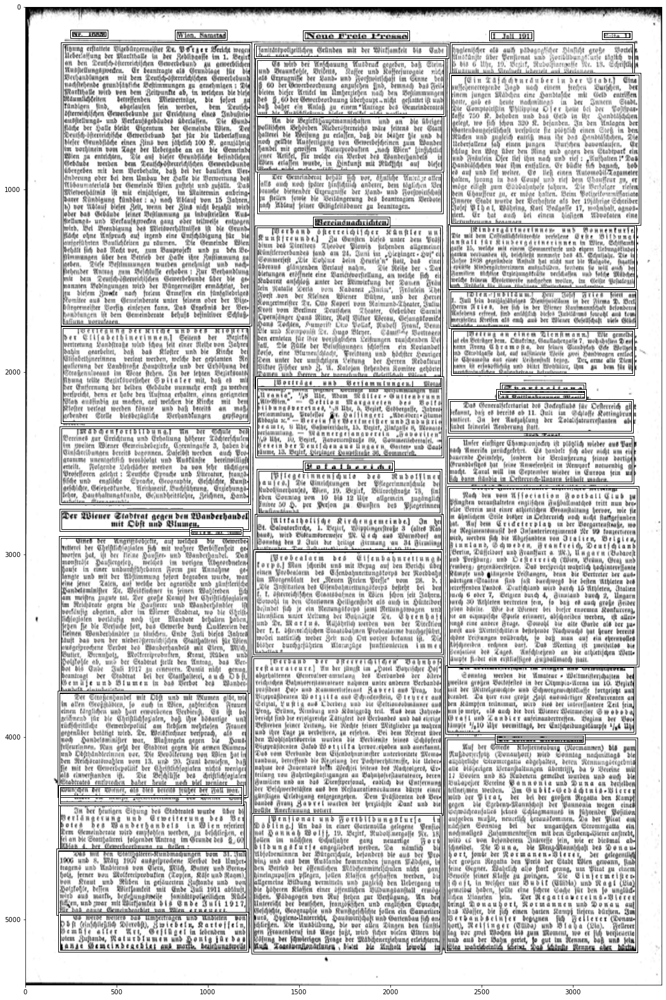

In [118]:
newBoxes = boxes*tensor([truth['size'][0]/800, truth['size'][1]/800, truth['size'][0]/800, truth['size'][1]/800]).cuda()

# trained on complex size=(800,800) images1
# s = .5
# boxes = prediction[0]['boxes'][prediction[0]['scores']>s]
ax = show_img(PIL.Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy()).resize(truth['size']), figsize=(18,30))
draw_rect(ax, newBoxes)
# draw_text(ax, prediction[0]['boxes'][prediction[0]['scores']>s], prediction[0]['labels'][prediction[0]['scores']>s])

# Assigning regions

In [119]:
import json
import numpy as np
import os
from citlab_python_util.parser.xml.page.page import Page
import cv2

path = '/home/davood/textSegmentChallenge/simple_pages_test'
pathxmls = os.path.join(path,'xmls')
pathimages = os.path.join(path,'images')
save_folder = os.path.join(path,'save')

base = truth['fn'][:-4]
xmlFN = Path(base+'.xml')
imageFN = Path(base+'.jpg')
page_filename = str(xmlFN)
save_path = os.path.join(save_folder, page_filename)
save_path

def dictMax(a):
    maxim = 0
    for k,v in a.items():
        if v>=maxim:
            maxim=v
            max_a = (k,v)
    return max_a

# dictMax(a)        

def numPointsContains(points, box):
    '''all points in a line; a single bbox'''
    i = 0
    for p in points:
        if box[0]<p[0]<box[2] and box[1]<p[1]<box[3]:
            i+=1
    return i

# def dist(point, box):
#     '''point: (average over x, average over x)'''
#     dx = min((point[0]-box[0])**2, (point[0]-box[2])**2)
#     dy = min((point[1]-box[1])**2, (point[1]-box[3])**2)
#     d = np.sqrt(dx+dy)
#     return d

def dist(point, box):
    '''point: (average over x, average over x)'''
    if box[0]<=point[0]<=box[2]:
        dy = min((point[1]-box[1])**2, (point[1]-box[3])**2)
        return dy
    else:
#     d = np.sqrt(dx+dy)
        return 1000000

bBoxes = newBoxes.tolist()
bBoxes = [tuple(x) for x in bBoxes]
len(bBoxes)

42

In [120]:
# box2id
box2id = {b:i for i,b in enumerate(bBoxes,1)}

p = Path(pathimages)

path_to_page = p.parent/'xmls'/xmlFN
path_to_image = p/imageFN

# generate page object
page_obj = Page(path_to_xml=str(path_to_page))

# all regions of the image (without image/graphic regions)
list_of_image_regions = page_obj.get_text_regions()


region = list_of_image_regions[0]

lines = region.text_lines

for line in lines:
    points = line.baseline.points_list
    points = [(x,y-10) for x,y in points]
    num_cont = 0
    
    for box in bBoxes:
        if numPointsContains(points, box)>num_cont:
            line.set_article_id(f'a{box2id[box]}')
            num_cont = numPointsContains(points, box)
    if num_cont==0:
        d = 10000000000000
        point = np.array(points).mean(axis=0)
        for box in bBoxes:
            if dist(point, box)<d:
                d = dist(point, box)
                line.set_article_id(f'a{box2id[box]}')
                print(points)
                print(dist(point, box))
                print(f'a{box2id[box]}')
        
num_cont

[(208, 2282), (325, 2283)]
1000000
a1
[(208, 2282), (325, 2283)]
11.905532419681549
a8
[(1276, 280), (1343, 278), (1440, 279), (1614, 279)]
1000000
a1
[(1276, 280), (1343, 278), (1440, 279), (1614, 279)]
101355.10112287104
a13
[(1276, 280), (1343, 278), (1440, 279), (1614, 279)]
53.78016495704651
a24
[(1276, 280), (1343, 278), (1440, 279), (1614, 279)]
4.674189105629921
a39
[(2730, 2355), (2810, 2351), (2941, 2353)]
658115.0751233697
a1
[(2730, 2355), (2810, 2351), (2941, 2353)]
16.511841773986816
a3


7

In [121]:
line.get_article_id()

'a4'

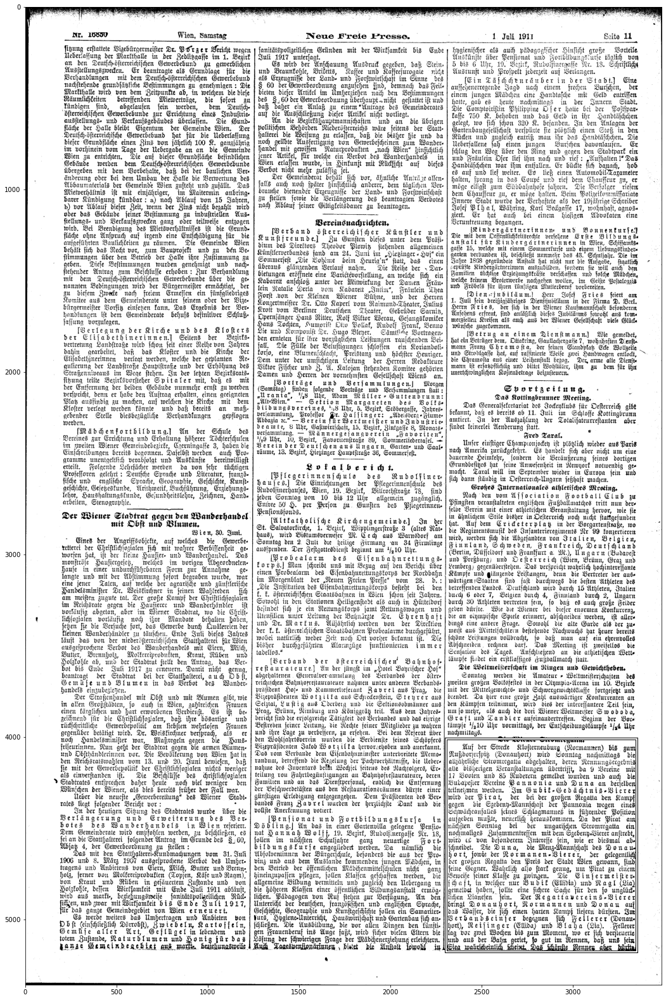

In [122]:
# trained on complex size=(800,800) images1,2
# s = .3
# img = PIL.Image.open(path_to_image)
img = PIL.Image.open(str(path_to_image)[:-3]+'tif')
img = img.convert('RGB')
ax = show_img(img, figsize=(18,30))
draw_rect(ax, [newBoxes[int(line.get_article_id()[1:])-1]])
# draw_text(ax, prediction[0]['boxes'][prediction[0]['scores']>s], prediction[0]['labels'][prediction[0]['scores']>s])

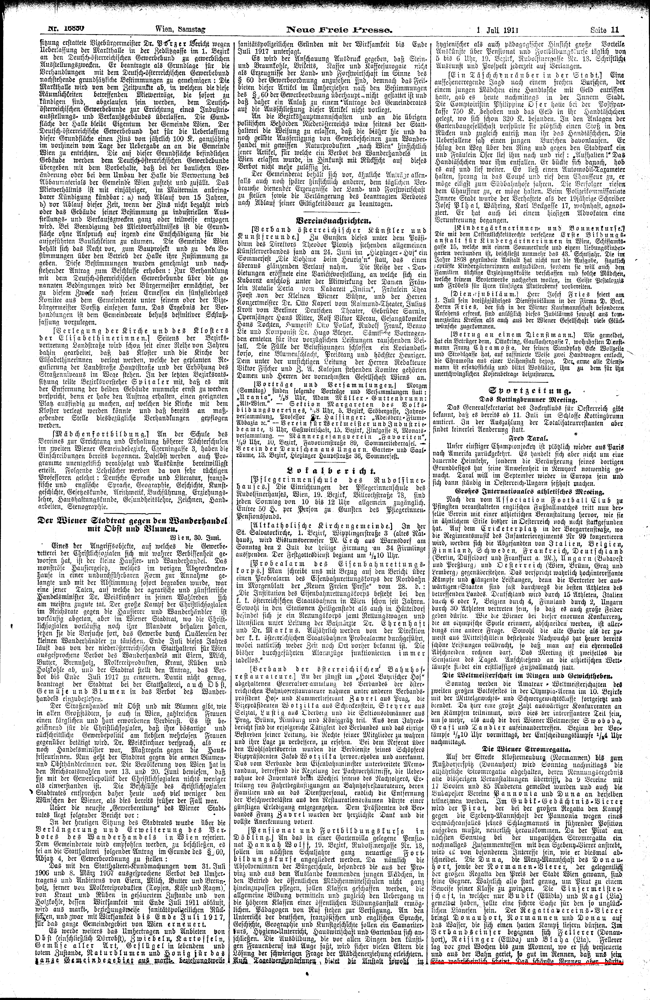

In [123]:
draw = ImageDraw.Draw(img)
draw.polygon(points,fill='red', outline='blue')
draw.line(points, fill='red', width=10)
img

In [124]:
# save the assigned block ID's
page_obj.set_textline_attr(textlines=lines)
page_obj.write_page_xml(save_path=save_path)

In [125]:
len(lines)

380

In [214]:
points

[(2325, 5106),
 (2448, 5106),
 (2524, 5106),
 (2893, 5105),
 (2962, 5106),
 (3039, 5105),
 (3240, 5104),
 (3345, 5105)]

In [143]:
img.size

(2746, 3589)

In [144]:
img.mode

'RGB'

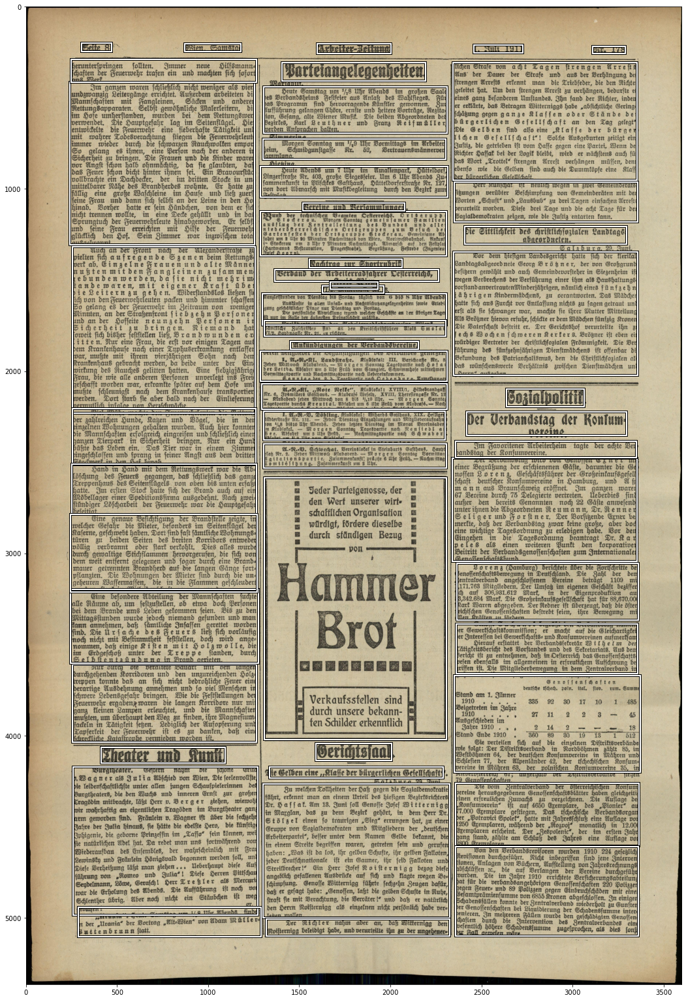

In [235]:
# trained on complex size=(800) images1,2
s = .5

ax = show_img(img, figsize=(18,30))
draw_rect(ax, newBoxes)
# draw_text(ax, prediction[0]['boxes'][prediction[0]['scores']>s], prediction[0]['labels'][prediction[0]['scores']>s])

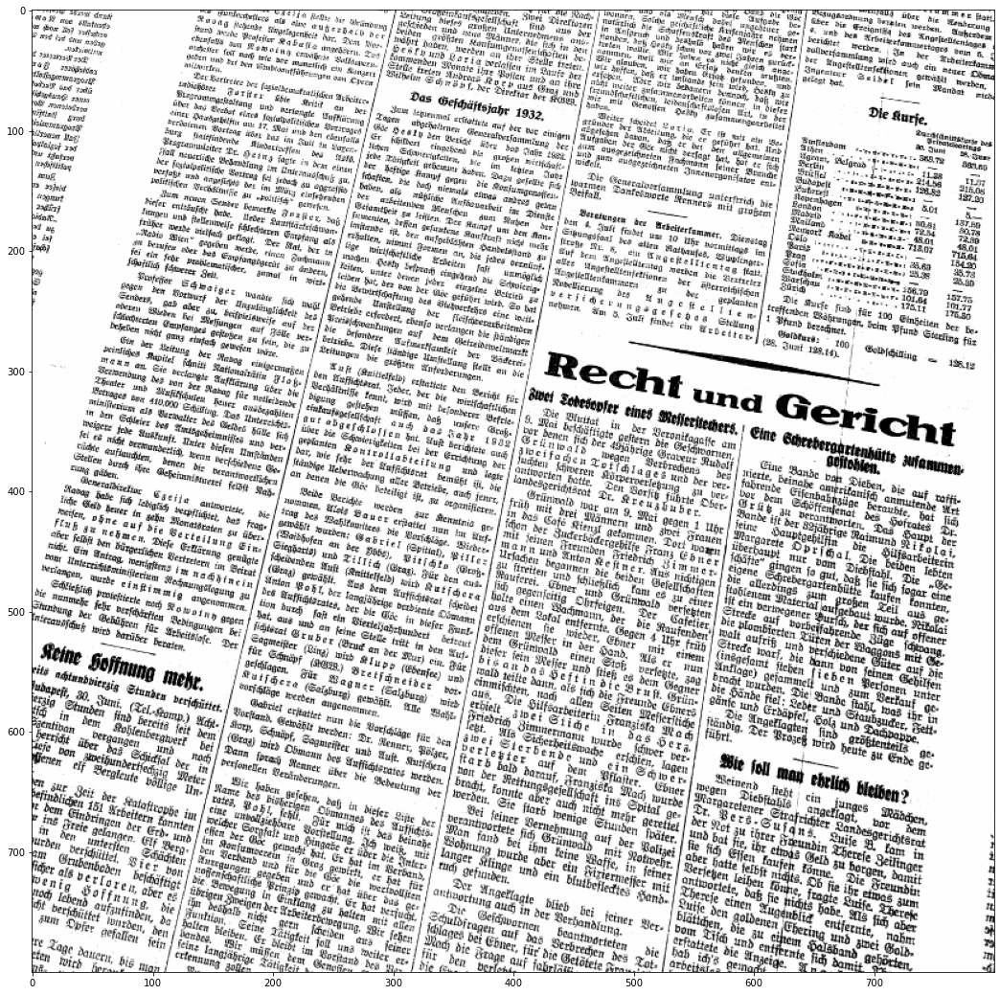

In [163]:
n=0
img, truth = dataset[n]
ax = show_img(PIL.Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy()), figsize=(18,30))
# draw_rect(ax, truth['boxes'])
# draw_text(ax, truth['boxes'], truth['labels'])

In [164]:
# pick one image from the test set
img, truth = dataset_test[0]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

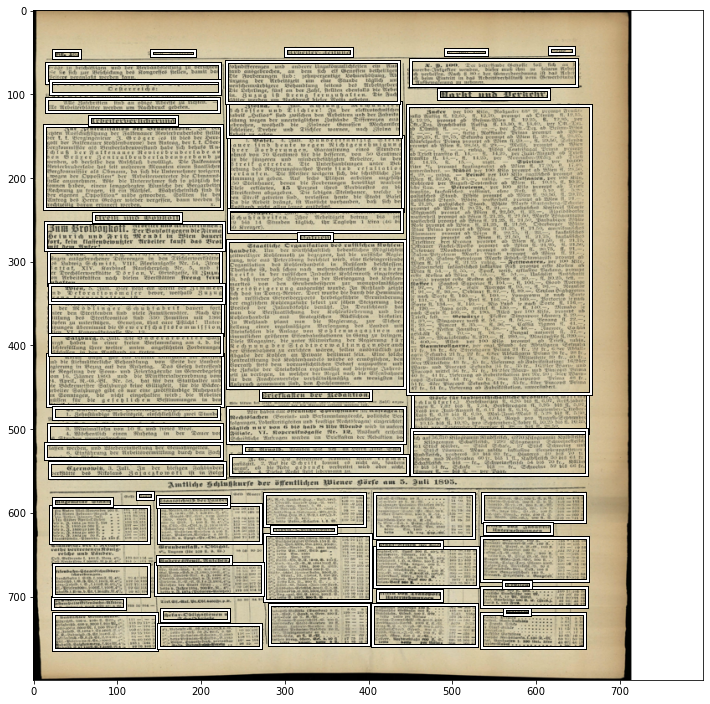

In [166]:
s = .8

ax = show_img(PIL.Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy()), figsize=(12,24))
draw_rect(ax, prediction[0]['boxes'][prediction[0]['scores']>s])
# draw_text(ax, prediction[0]['boxes'][prediction[0]['scores']>s], prediction[0]['labels'][prediction[0]['scores']>s])

And let's now visualize the top predicted segmentation mask. The masks are predicted as `[N, 1, H, W]`, where `N` is the number of predictions, and are probability maps between 0-1.

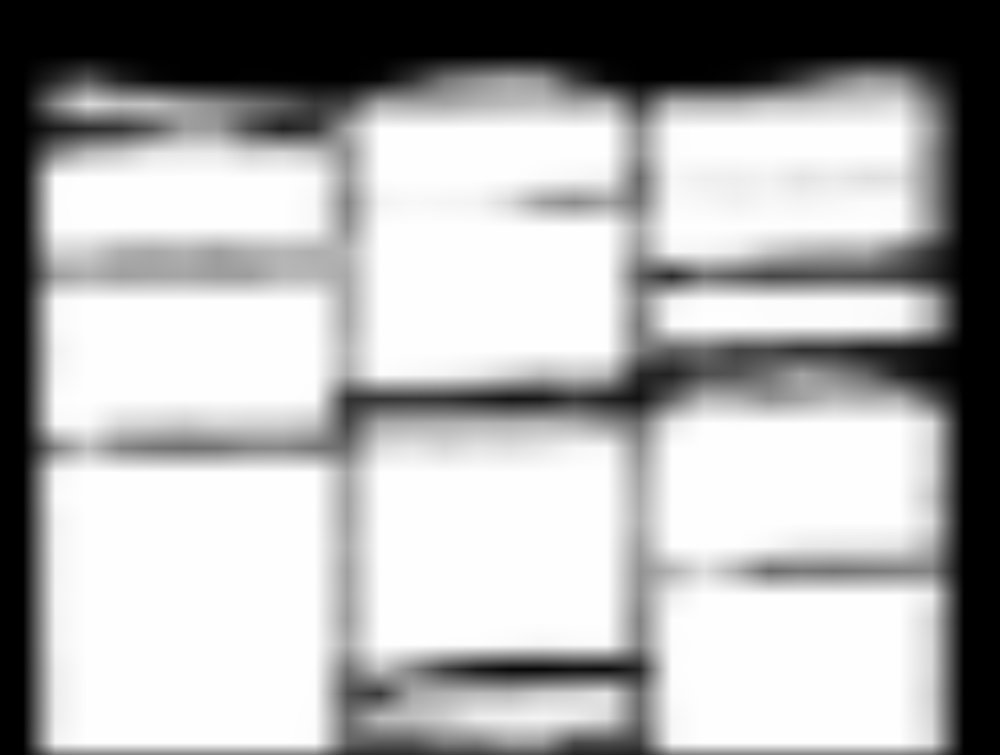

In [14]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

In [14]:
truth

{'boxes': tensor([[ 26.,   0., 505., 745.]]),
 'labels': tensor([1]),
 'masks': tensor([[[0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          ...,
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0],
          [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8),
 'image_id': tensor([9]),
 'area': tensor([356855.]),
 'iscrowd': tensor([0])}

In [ ]:
bb = data[1][0]['boxes']
ax = show_img(img, figsize=(18,18))
draw_rect(ax, bb)

In [28]:
truth['masks'].mul(255).permute(2,1,0).byte().cpu().numpy().squeeze()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [83]:
test_set = TestDataset('/home/davood/textSegmentChallenge/others/', get_transform(train=False))

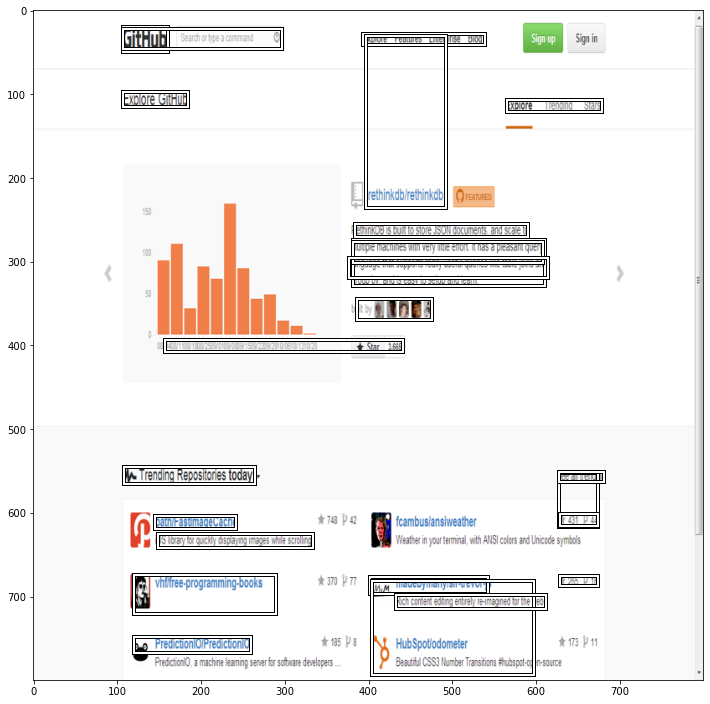

In [88]:
n=4
# pick one image from the test set
img, truth = test_set[n]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

s = .5

ax = show_img(PIL.Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy()), figsize=(12,24))
draw_rect(ax, prediction[0]['boxes'][prediction[0]['scores']>s])
# draw_text(ax, prediction[0]['boxes'][prediction[0]['scores']>s], prediction[0]['labels'][prediction[0]['scores']>s])

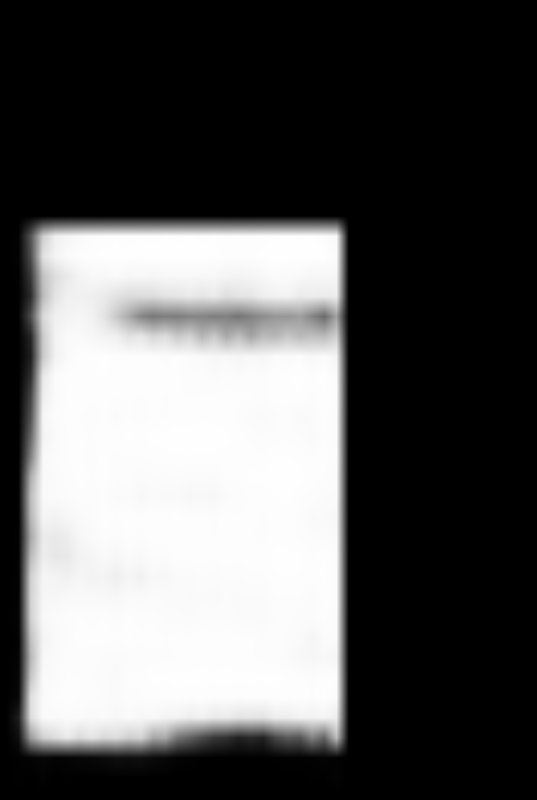

In [10]:
Image.fromarray(prediction[0]['masks'][2, 0].mul(255).byte().cpu().numpy())

Looks pretty good!

## Wrapping up

In this tutorial, you have learned how to create your own training pipeline for instance segmentation models, on a custom dataset.
For that, you wrote a `torch.utils.data.Dataset` class that returns the images and the ground truth boxes and segmentation masks. You also leveraged a Mask R-CNN model pre-trained on COCO train2017 in order to perform transfer learning on this new dataset.

For a more complete example, which includes multi-machine / multi-gpu training, check `references/detection/train.py`, which is present in the [torchvision GitHub repo](https://github.com/pytorch/vision/tree/v0.3.0/references/detection). 

